In [1]:
!pip install sentence-transformers pandas openpyxl

In [ ]:
from google.colab import files
uploaded = files.upload()  # Upload your Excel file (modified_results.xlsx)

Saving modified_results.xlsx to modified_results.xlsx


/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/4.12k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/471M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

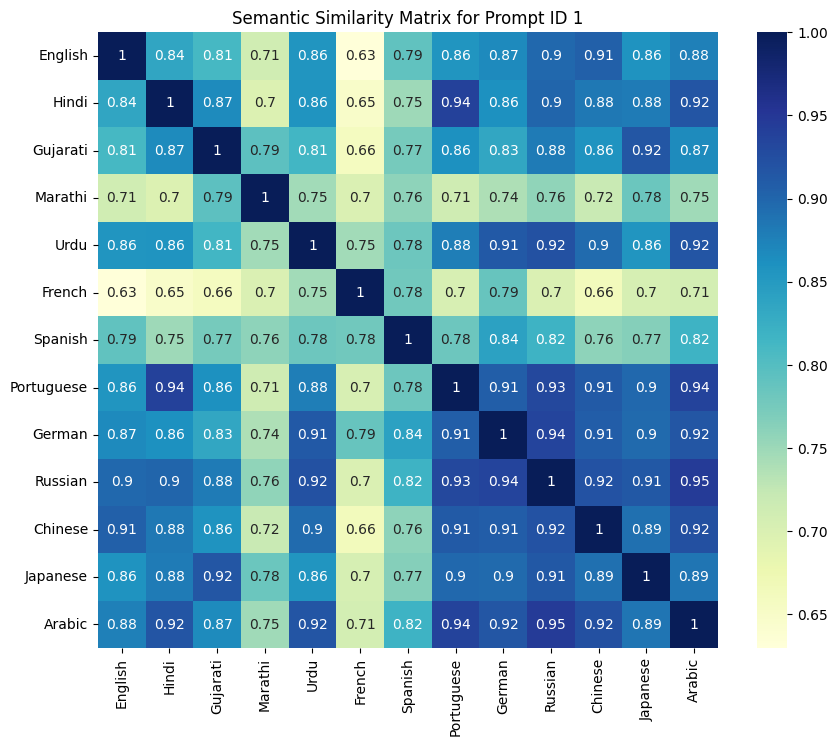

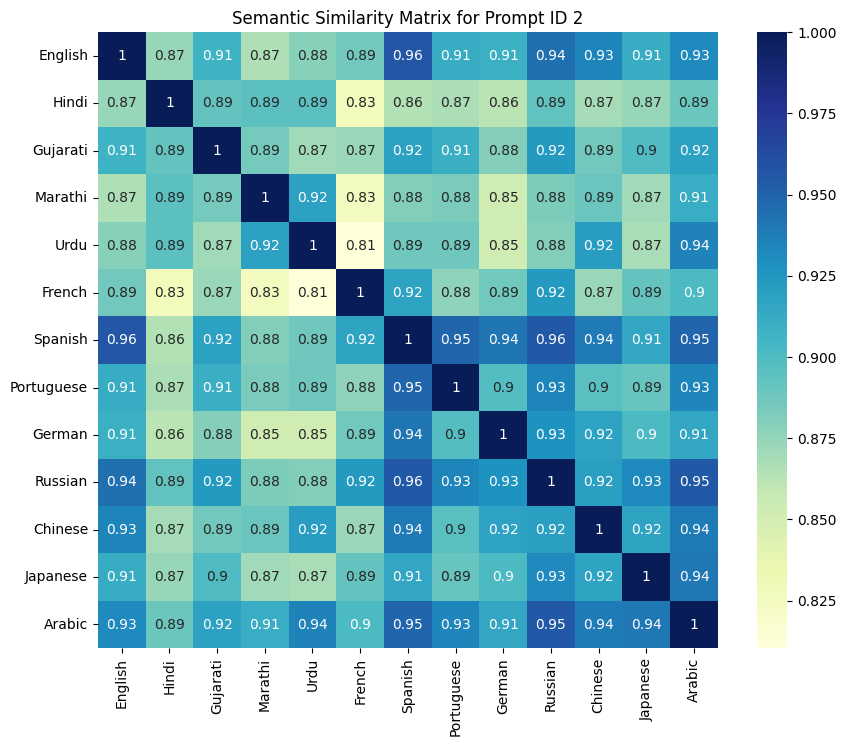

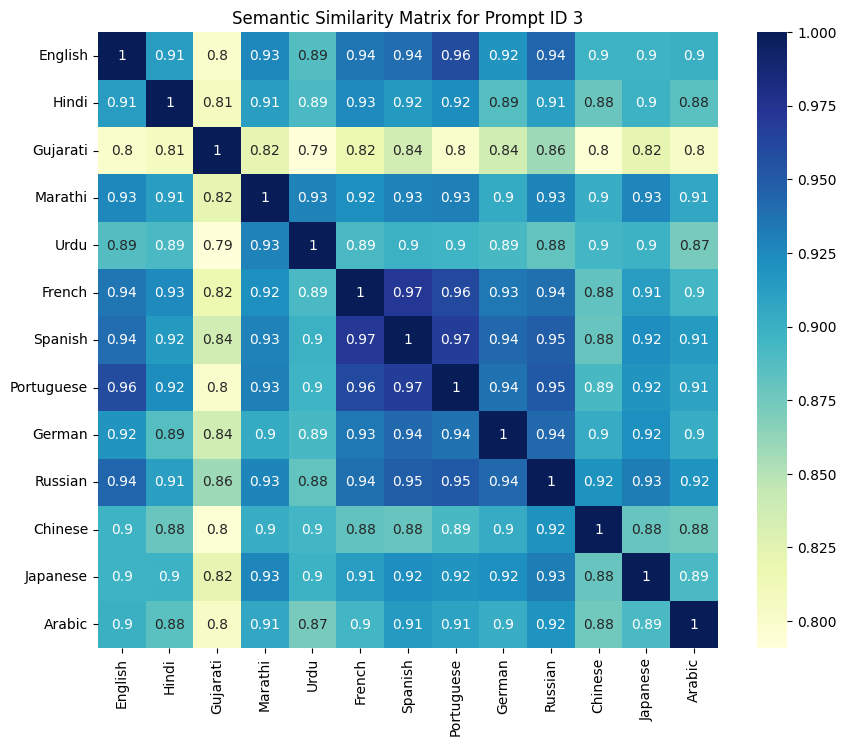

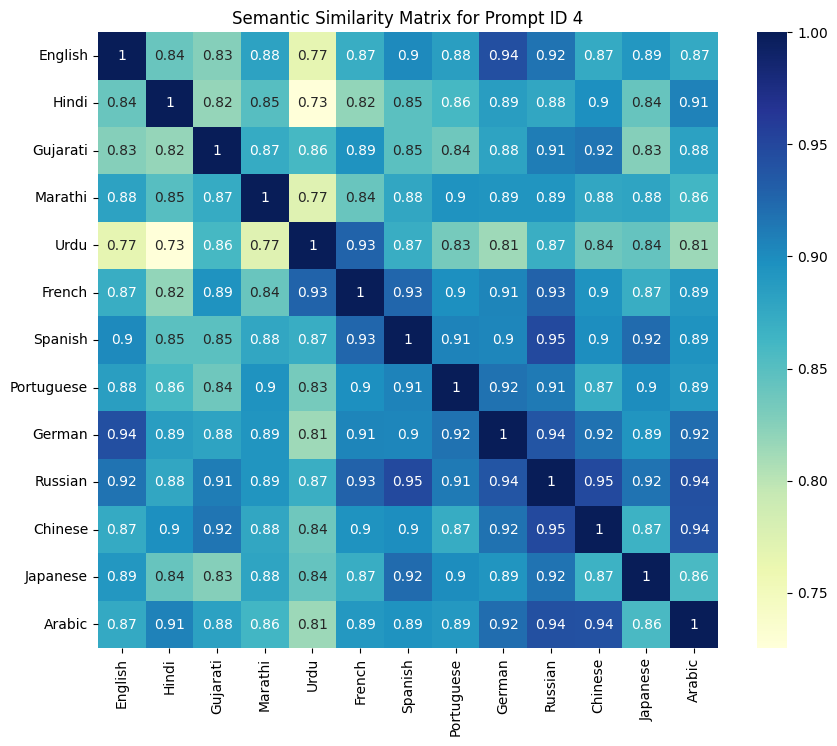

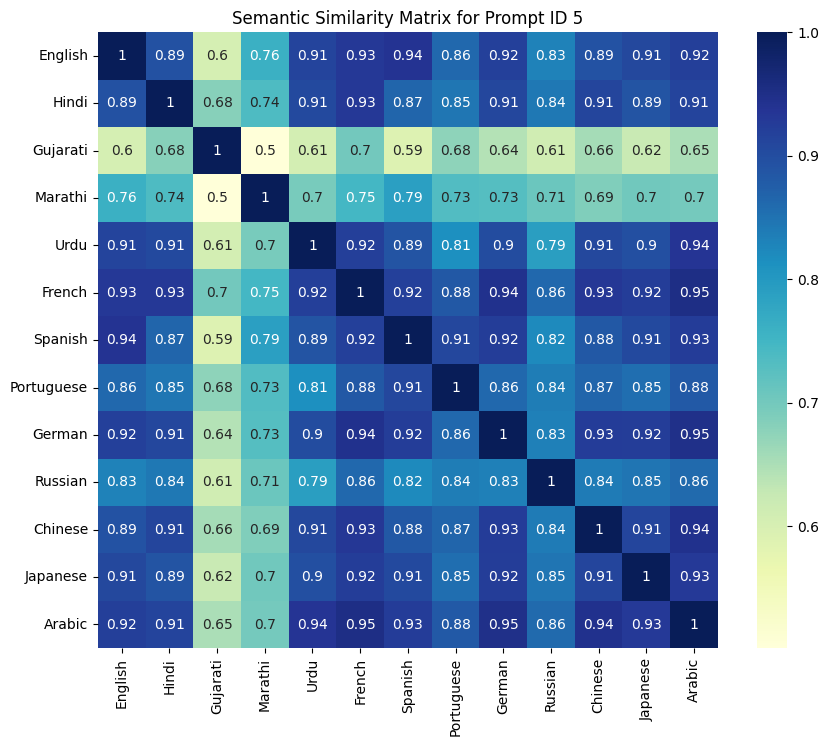

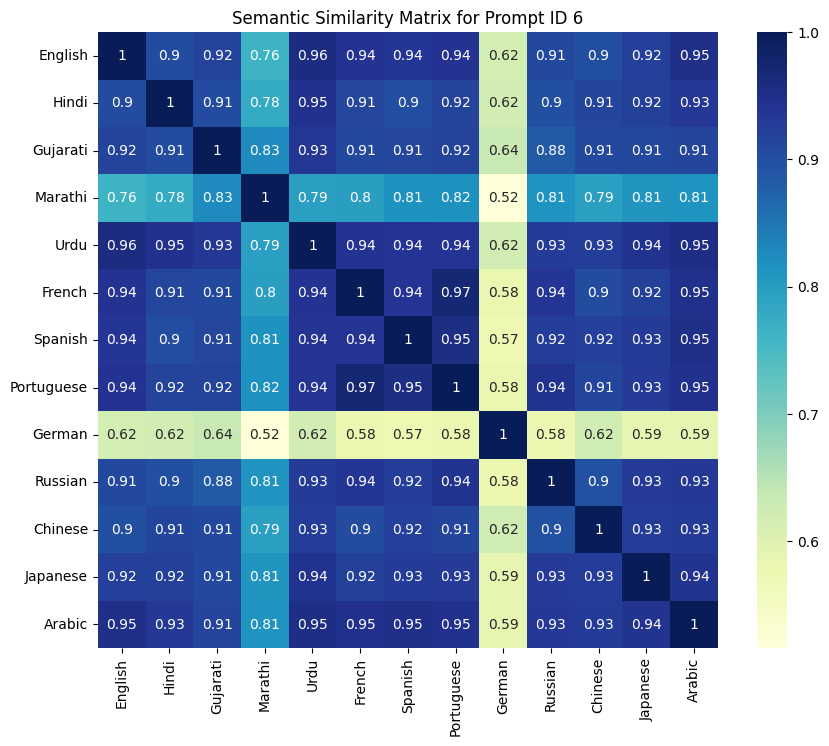

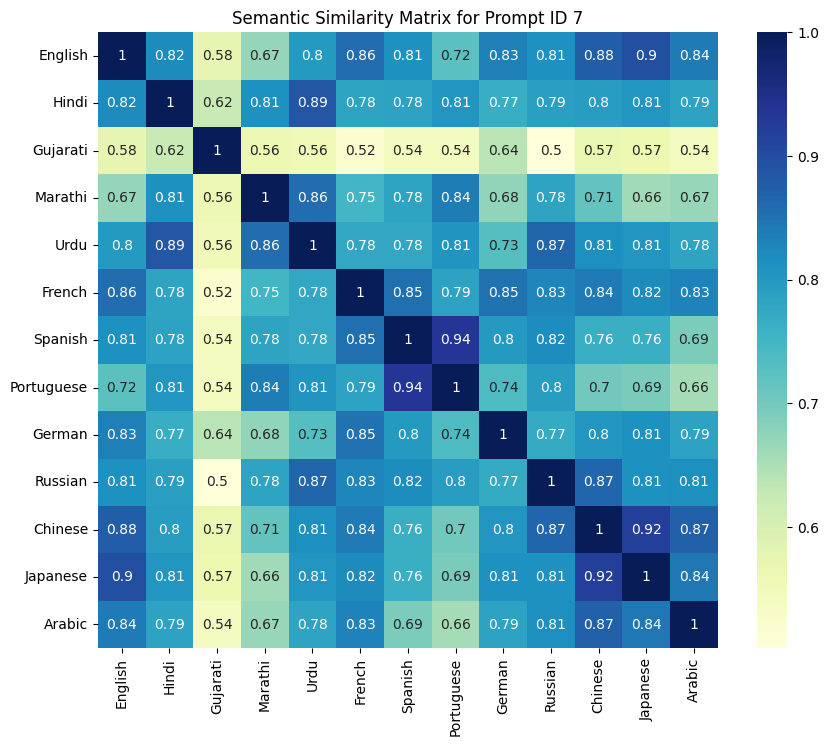

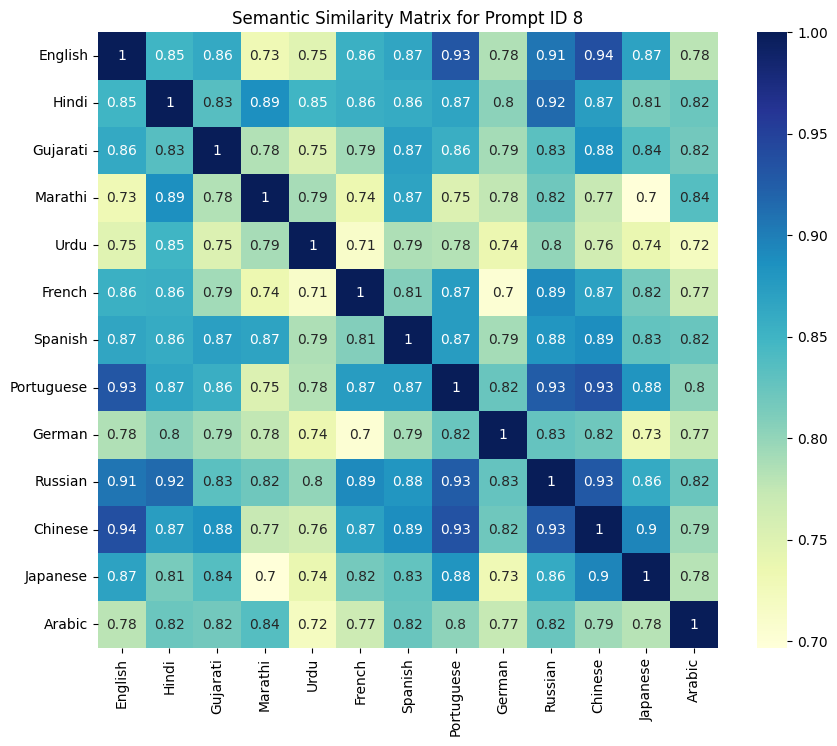

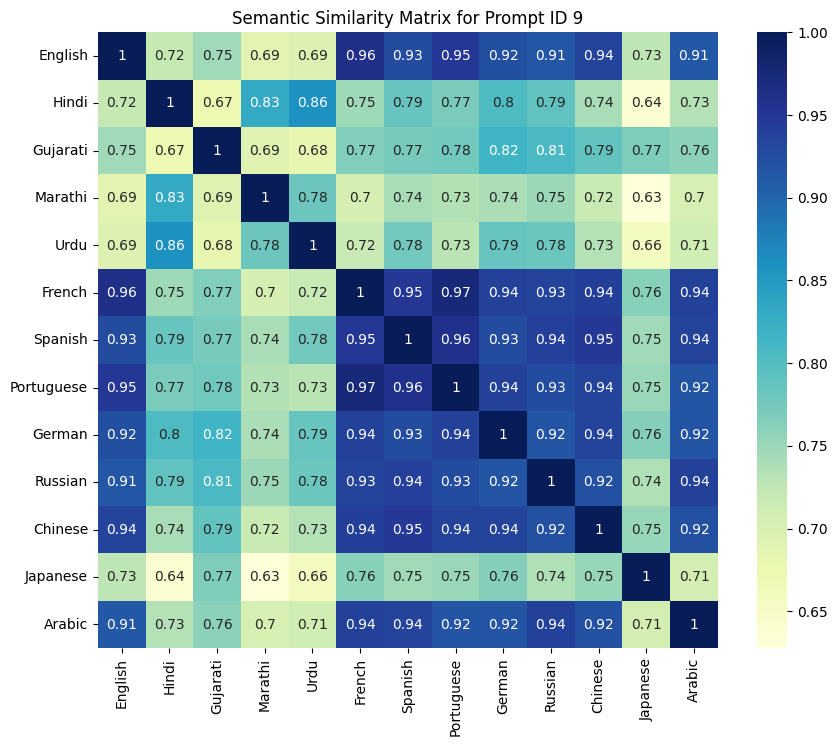

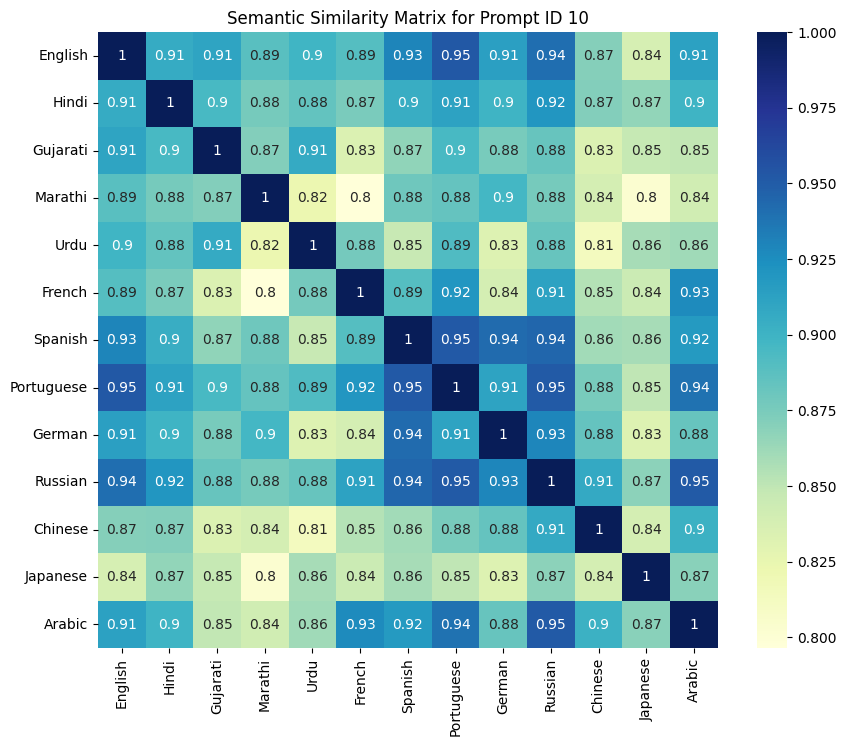

In [2]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Calculate embeddings and similarity matrices
similarity_matrices = {}
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()
    similarity_matrices[prompt_id] = similarity_matrix

    # Plot and visualize the similarity matrix for each prompt
    plt.figure(figsize=(10, 8))
    sns.heatmap(similarity_matrix, annot=True, xticklabels=languages, yticklabels=languages, cmap="YlGnBu")
    plt.title(f"Semantic Similarity Matrix for Prompt ID {prompt_id}")
    plt.show()


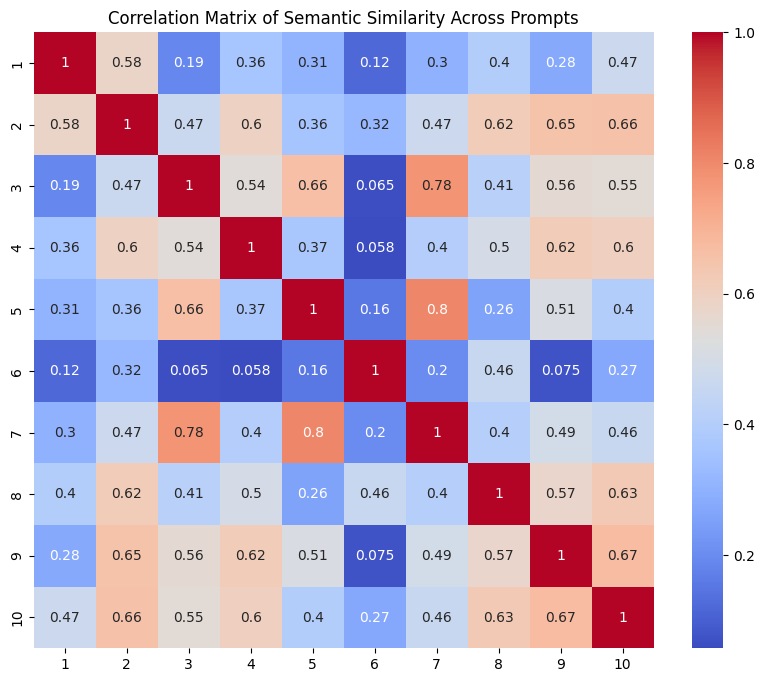

In [3]:
all_scores = []
for prompt_id, sim_matrix in similarity_matrices.items():
    all_scores.append(sim_matrix.flatten())
correlation_matrix = np.corrcoef(all_scores)

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", xticklabels=df['Prompt_ID'].unique(),
            yticklabels=df['Prompt_ID'].unique())
plt.title("Correlation Matrix of Semantic Similarity Across Prompts")
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
<ipython-input-4-3ec3267e6205>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=similarity_df, x="Prompt_ID", y="Similarity_Score", palette="YlGnBu")


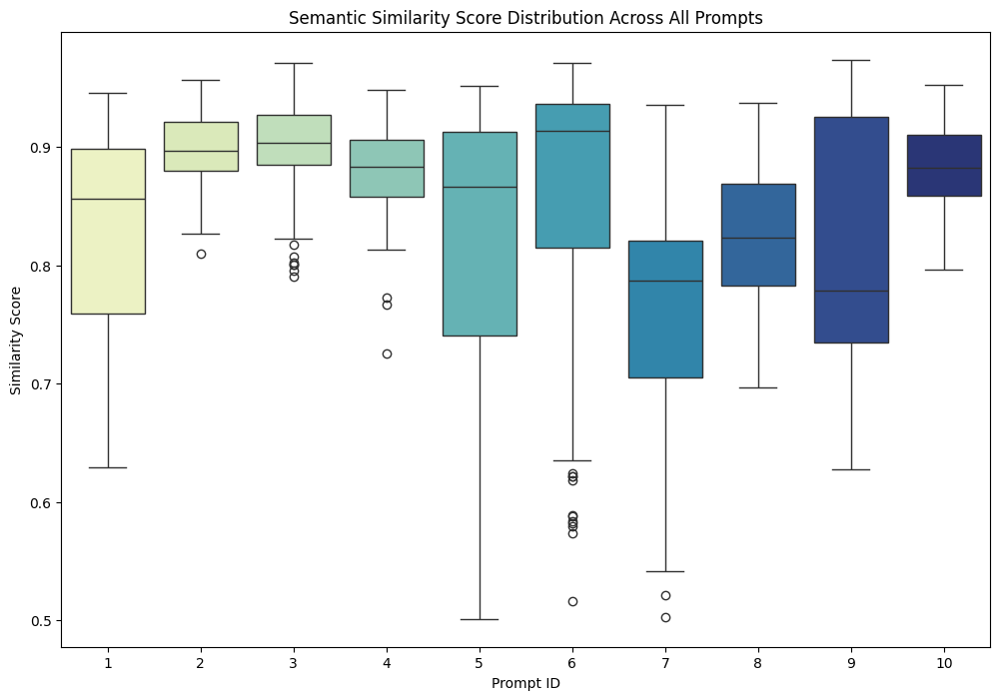

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


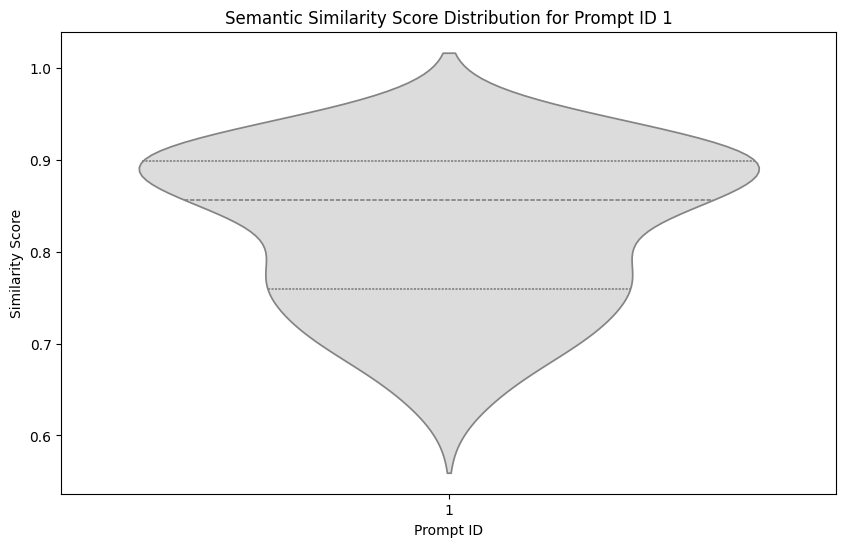

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


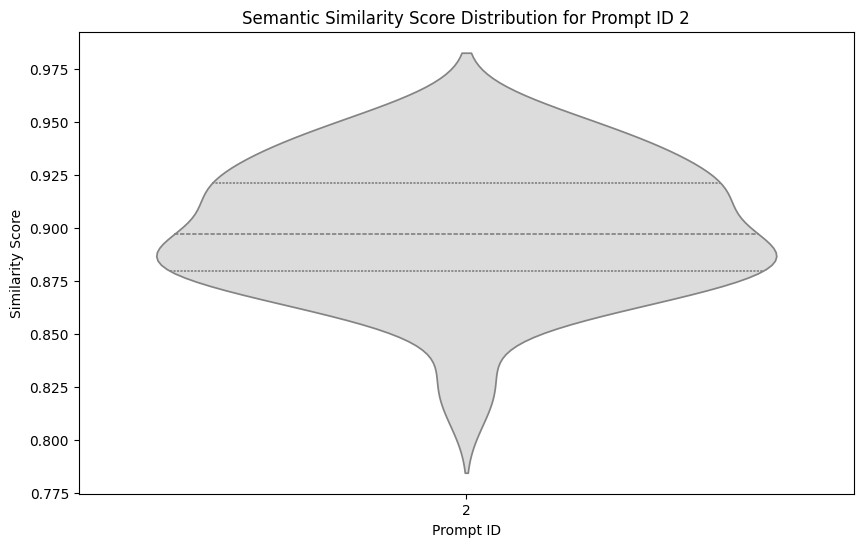

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


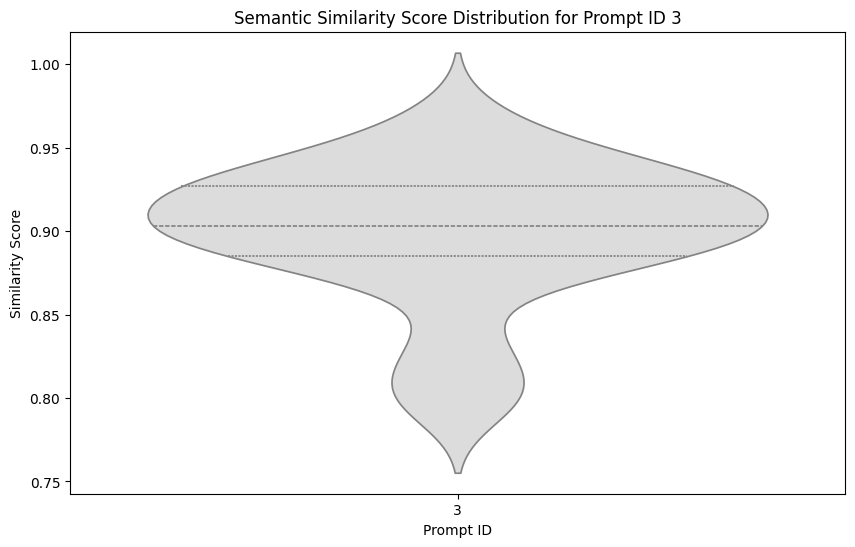

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


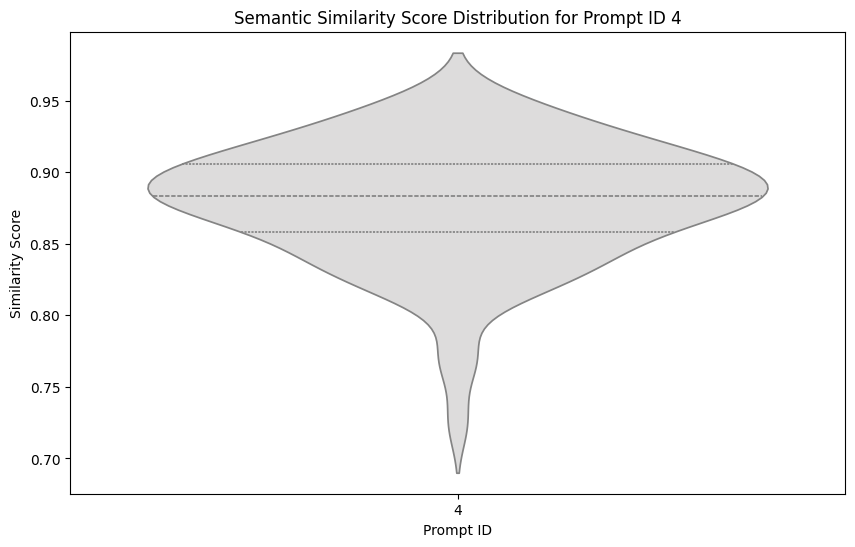

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


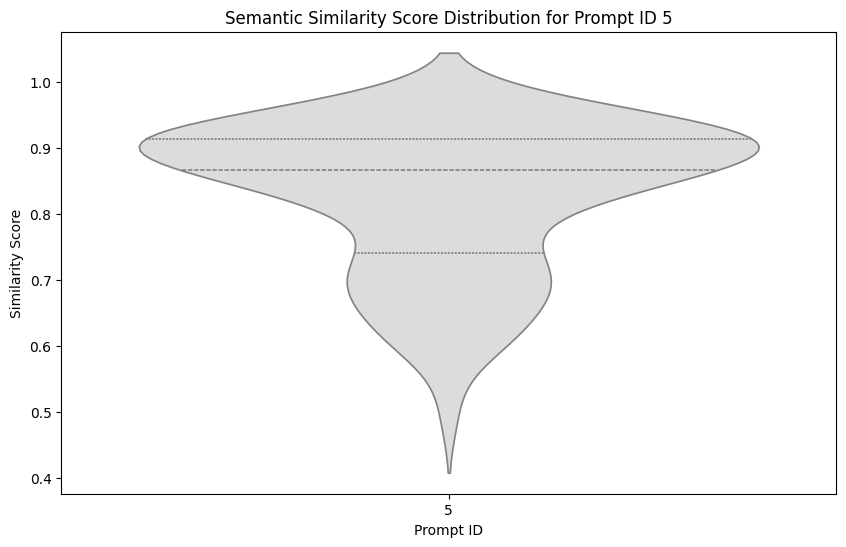

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


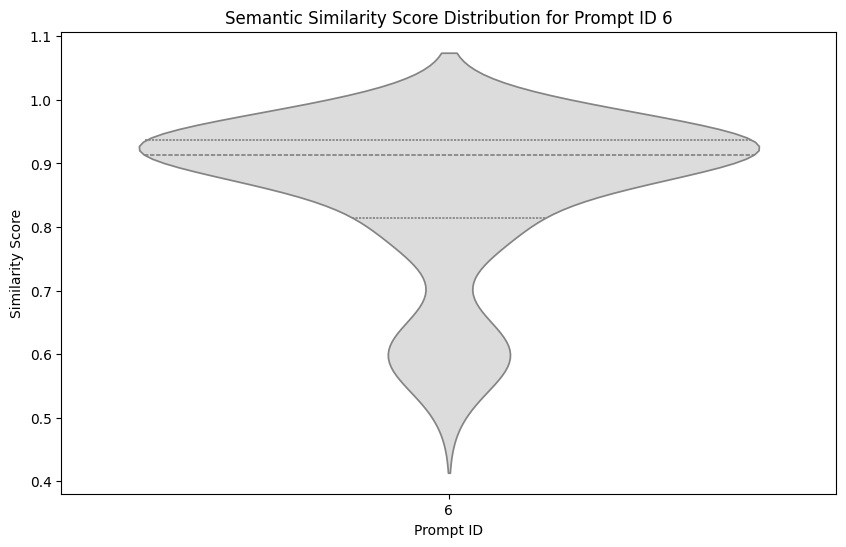

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


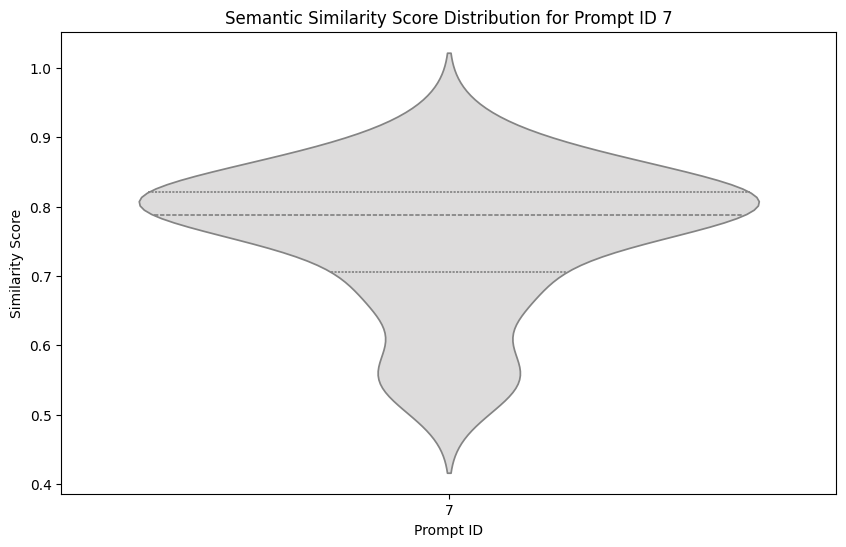

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


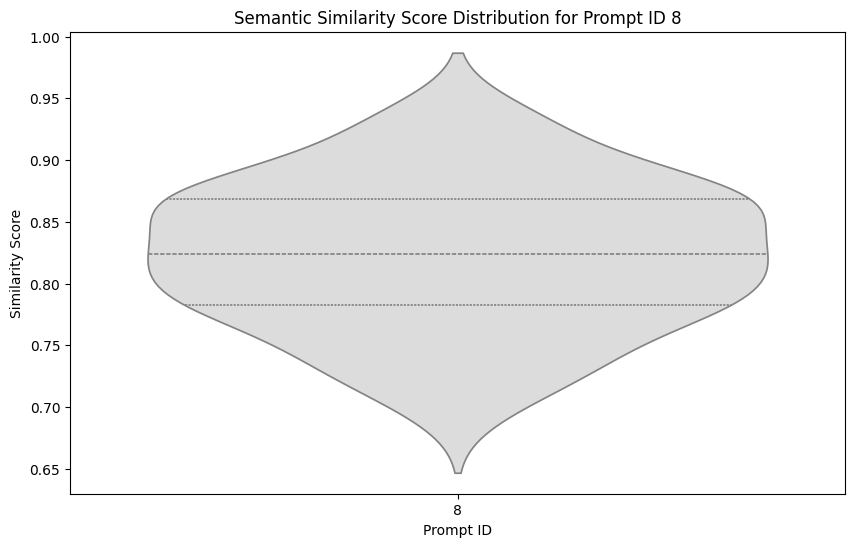

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


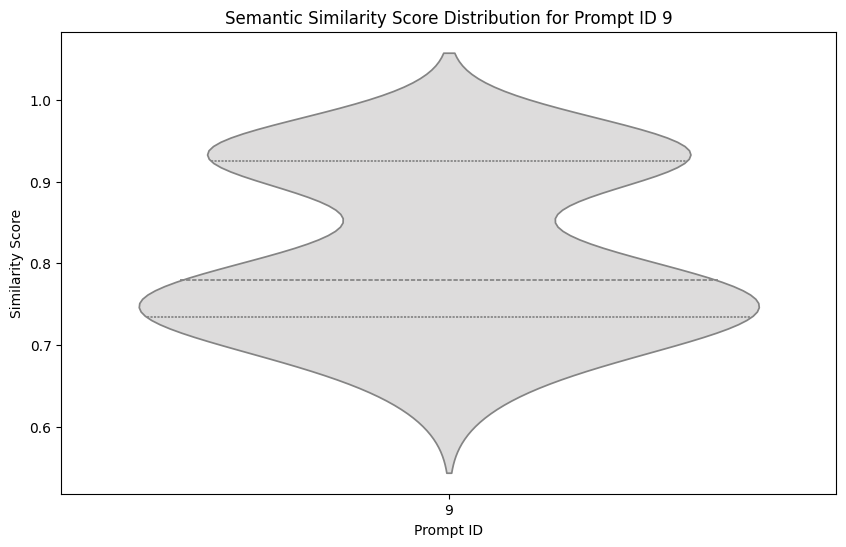

<ipython-input-4-3ec3267e6205>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],


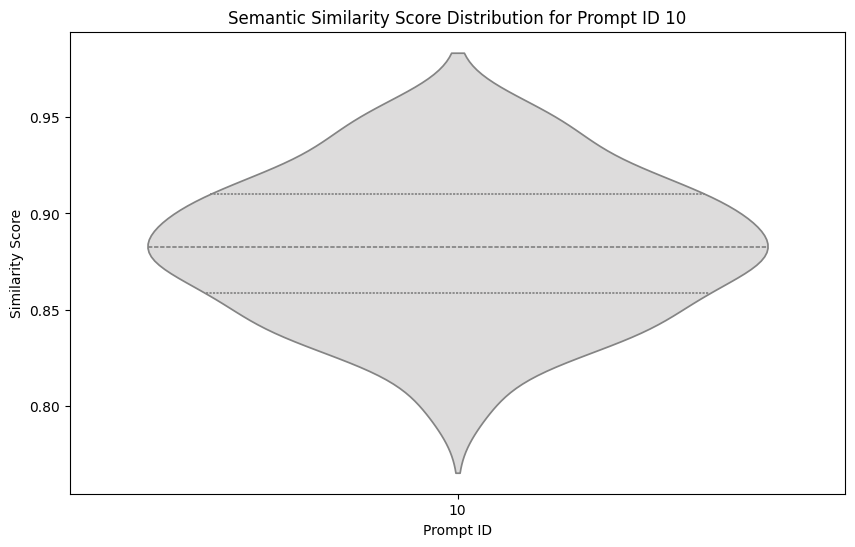

In [4]:
# To analyze the semantic similarity distribution for each prompt across all languages,
# we can calculate the pairwise similarity scores for each language pair within each prompt and then visualize these distributions.
#

import pandas as pd
from sentence_transformers import SentenceTransformer, util
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Calculate embeddings and similarity scores
similarity_scores = []

for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten the similarity matrix to get pairwise similarity scores
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_scores.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j].item()
            })

# Convert similarity scores to a DataFrame
similarity_df = pd.DataFrame(similarity_scores)

# Plot similarity score distribution for each prompt
plt.figure(figsize=(12, 8))
sns.boxplot(data=similarity_df, x="Prompt_ID", y="Similarity_Score", palette="YlGnBu")
plt.title("Semantic Similarity Score Distribution Across All Prompts")
plt.xlabel("Prompt ID")
plt.ylabel("Similarity Score")
plt.show()

# Plot similarity score distributions per prompt using violin plots for detail
for prompt_id in df['Prompt_ID'].unique():
    plt.figure(figsize=(10, 6))
    sns.violinplot(data=similarity_df[similarity_df['Prompt_ID'] == prompt_id],
                   x="Prompt_ID", y="Similarity_Score", inner="quartile", palette="coolwarm")
    plt.title(f"Semantic Similarity Score Distribution for Prompt ID {prompt_id}")
    plt.xlabel("Prompt ID")
    plt.ylabel("Similarity Score")
    plt.show()


In [5]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
import numpy as np
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Load the Excel file
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Collect similarity data for each prompt
similarity_data = []

# Calculate embeddings and similarity matrices
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j]
            })

# Convert similarity data to a DataFrame
similarity_df = pd.DataFrame(similarity_data)

# Step 1: Aggregate similarity scores by language pair across prompts
similarity_means = similarity_df.groupby("Language_Pair")["Similarity_Score"].mean().reset_index()

# Prepare data for ANOVA using statsmodels
anova_df = similarity_df.copy()
anova_df['Language_Pair'] = anova_df['Language_Pair'].astype('category')
anova_df['Prompt_ID'] = anova_df['Prompt_ID'].astype('category')

# Define the model for ANOVA
anova_model = ols('Similarity_Score ~ C(Language_Pair)', data=anova_df).fit()
anova_table = sm.stats.anova_lm(anova_model, typ=2)

# Display detailed ANOVA table
print("Detailed ANOVA Table for Differences in Average Similarity Scores Across Language Pairs:")
print(anova_table)

# Step 2: Chi-Square Test for Consistency in Language Pair Similarities
# Bin similarity scores for chi-square analysis
similarity_df['Similarity_Bin'] = pd.cut(similarity_df['Similarity_Score'], bins=[-1, 0.33, 0.66, 1], labels=["Low", "Medium", "High"])

# Create contingency table for language pairs and similarity bins
contingency_table = pd.crosstab(similarity_df['Language_Pair'], similarity_df['Similarity_Bin'])
chi2, p, dof, expected = chi2_contingency(contingency_table)

print("\nChi-Square Test for Similarity Pattern Consistency:")
print(f"Chi2 Statistic: {chi2}, p-value: {p}")


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Detailed ANOVA Table for Differences in Average Similarity Scores Across Language Pairs:
                    sum_sq     df         F        PR(>F)
C(Language_Pair)  1.217266   77.0  2.153203  2.291167e-07
Residual          5.154029  702.0       NaN           NaN

Chi-Square Test for Similarity Pattern Consistency:
Chi2 Statistic: 89.38378378378378, p-value: 0.15817063050560742


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Tukey's HSD Results for Prompt 1:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0314   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0454   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0174   nan   nan   nan  False
     Chinese-Arabic      English-French  -0.2927   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.0548   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.1106   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.0866   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.0629   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.2103   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese  -0.0659   nan   nan   nan  False
    

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0217   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0069   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0045   nan   nan   nan  False
     Chinese-Arabic      English-French  -0.0524   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.0294   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati   -0.032   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.0652   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.0274   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.0725   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese  -0.0273   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Tukey's HSD Results for Prompt 3:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese   0.0041   nan   nan   nan  False
     Chinese-Arabic      English-Arabic   0.0248   nan   nan   nan  False
     Chinese-Arabic     English-Chinese   0.0219   nan   nan   nan  False
     Chinese-Arabic      English-French   0.0608   nan   nan   nan  False
     Chinese-Arabic      English-German   0.0436   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.0751   nan   nan   nan  False
     Chinese-Arabic       English-Hindi   0.0381   nan   nan   nan  False
     Chinese-Arabic    English-Japanese   0.0218   nan   nan   nan  False
     Chinese-Arabic     English-Marathi   0.0508   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese   0.0835   nan   nan   nan  False
    

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0745   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0665   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0669   nan   nan   nan  False
     Chinese-Arabic      English-French  -0.0706   nan   nan   nan  False
     Chinese-Arabic      English-German   0.0027   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.1157   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.1008   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.0502   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.0596   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese  -0.0564   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0327   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0235   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0526   nan   nan   nan  False
     Chinese-Arabic      English-French   -0.013   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.0252   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.3399   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.0494   nan   nan   nan  False
     Chinese-Arabic    English-Japanese   -0.036   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.1822   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese  -0.0812   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0023   nan   nan   nan  False
     Chinese-Arabic      English-Arabic   0.0216   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0265   nan   nan   nan  False
     Chinese-Arabic      English-French   0.0123   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.3097   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.0124   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.0238   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.0066   nan   nan   nan  False
     Chinese-Arabic     English-Marathi   -0.166   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese   0.0126   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Tukey's HSD Results for Prompt 7:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese   0.0489   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0328   nan   nan   nan  False
     Chinese-Arabic     English-Chinese    0.004   nan   nan   nan  False
     Chinese-Arabic      English-French  -0.0155   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.0385   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.2944   nan   nan   nan  False
     Chinese-Arabic       English-Hindi   -0.052   nan   nan   nan  False
     Chinese-Arabic    English-Japanese   0.0247   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.2009   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese  -0.1502   nan   nan   nan  False
    

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese    0.102   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0143   nan   nan   nan  False
     Chinese-Arabic     English-Chinese   0.1435   nan   nan   nan  False
     Chinese-Arabic      English-French   0.0616   nan   nan   nan  False
     Chinese-Arabic      English-German  -0.0092   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati   0.0683   nan   nan   nan  False
     Chinese-Arabic       English-Hindi   0.0551   nan   nan   nan  False
     Chinese-Arabic    English-Japanese   0.0756   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.0624   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese   0.1368   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.1698   nan   nan   nan  False
     Chinese-Arabic      English-Arabic  -0.0091   nan   nan   nan  False
     Chinese-Arabic     English-Chinese    0.013   nan   nan   nan  False
     Chinese-Arabic      English-French   0.0391   nan   nan   nan  False
     Chinese-Arabic      English-German   0.0009   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati  -0.1757   nan   nan   nan  False
     Chinese-Arabic       English-Hindi  -0.2005   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.1946   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.2353   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese   0.0275   nan   nan   nan  False
     Chinese-Arabic     English-Russia

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


           Multiple Comparison of Means - Tukey HSD, FWER=0.05           
       group1              group2       meandiff p-adj lower upper reject
-------------------------------------------------------------------------
     Chinese-Arabic    Chinese-Japanese  -0.0625   nan   nan   nan  False
     Chinese-Arabic      English-Arabic   0.0114   nan   nan   nan  False
     Chinese-Arabic     English-Chinese  -0.0312   nan   nan   nan  False
     Chinese-Arabic      English-French  -0.0121   nan   nan   nan  False
     Chinese-Arabic      English-German   0.0119   nan   nan   nan  False
     Chinese-Arabic    English-Gujarati   0.0092   nan   nan   nan  False
     Chinese-Arabic       English-Hindi   0.0038   nan   nan   nan  False
     Chinese-Arabic    English-Japanese  -0.0644   nan   nan   nan  False
     Chinese-Arabic     English-Marathi  -0.0134   nan   nan   nan  False
     Chinese-Arabic  English-Portuguese   0.0509   nan   nan   nan  False
     Chinese-Arabic     English-Russia

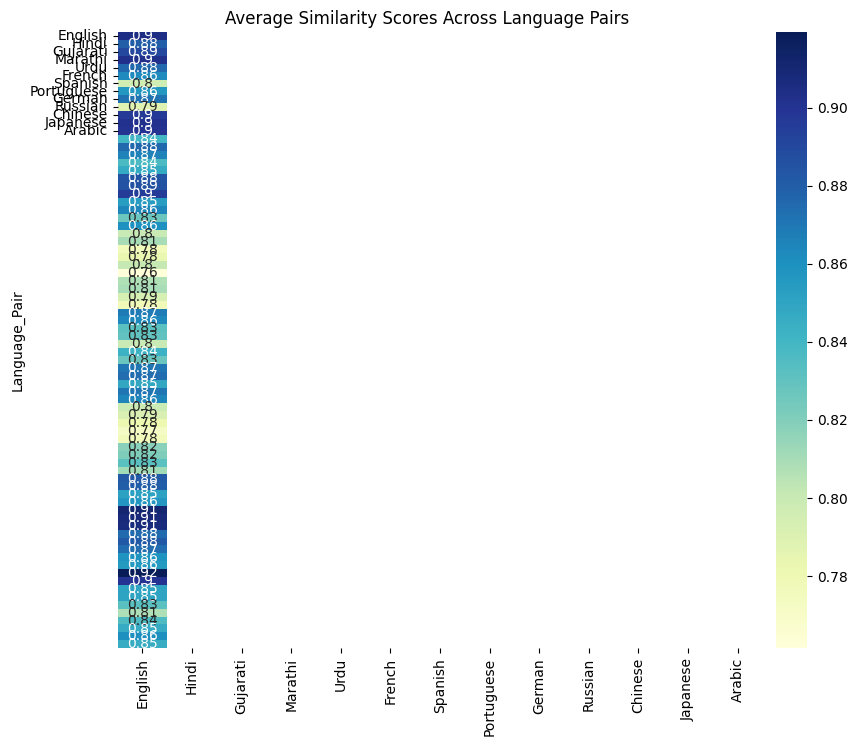

In [ ]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Collect similarity data for each prompt
similarity_data = []

# Calculate embeddings and similarity matrices for each prompt
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j]
            })

# Convert similarity data to DataFrame
similarity_df = pd.DataFrame(similarity_data)

# Step 1: Conduct ANOVA and Tukey HSD for Pairwise Comparisons
anova_results = []
for prompt_id in similarity_df['Prompt_ID'].unique():
    prompt_data = similarity_df[similarity_df['Prompt_ID'] == prompt_id]

    # Group similarity scores by language pair
    language_pair_groups = [group["Similarity_Score"].values for name, group in prompt_data.groupby("Language_Pair")]
    anova_result = f_oneway(*language_pair_groups)

    # Store ANOVA results
    anova_results.append({
        "Prompt_ID": prompt_id,
        "F-Statistic": anova_result.statistic,
        "p-Value": anova_result.pvalue
    })

    # Conduct Tukey's HSD for pairwise comparisons on the similarity scores
    tukey_result = pairwise_tukeyhsd(prompt_data['Similarity_Score'], prompt_data['Language_Pair'], alpha=0.05)
    print(f"Tukey's HSD Results for Prompt {prompt_id}:")
    print(tukey_result.summary())

anova_df = pd.DataFrame(anova_results)
print("Pairwise ANOVA Results:")
print(anova_df)

# Step 2: Multivariate Clustering of Similarity Scores
# Prepare the data by averaging similarity scores across prompts for each language pair
similarity_avg_df = similarity_df.groupby("Language_Pair")["Similarity_Score"].mean().reset_index()
similarity_avg_matrix = similarity_avg_df.pivot_table(values="Similarity_Score", index="Language_Pair")

# Use a heatmap to visualize average similarity scores
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_avg_matrix, annot=True, cmap="YlGnBu", xticklabels=languages, yticklabels=languages)
plt.title("Average Similarity Scores Across Language Pairs")
plt.show()


In [ ]:
### Filtered Significant Results:

# Only pairs with statistically significant differences are shown (where the p-value is < 0.05).
# For each prompt, the output displays pairs, mean difference, adjusted p-value, and significance indicator (reject column).
#
###Grouped Output by Prompt:

#For each prompt, significant results are shown, allowing you to interpret specific language pairings with notable differences.
####

import pandas as pd
from sentence_transformers import SentenceTransformer, util
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Collect similarity data for each prompt
similarity_data = []

# Calculate embeddings and similarity matrices for each prompt
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j]
            })

# Convert similarity data to DataFrame
similarity_df = pd.DataFrame(similarity_data)

# Step 1: Conduct ANOVA and Tukey HSD for Pairwise Comparisons
anova_results = []
significant_comparisons = []

for prompt_id in similarity_df['Prompt_ID'].unique():
    prompt_data = similarity_df[similarity_df['Prompt_ID'] == prompt_id]

    # Group similarity scores by language pair
    language_pair_groups = [group["Similarity_Score"].values for name, group in prompt_data.groupby("Language_Pair")]
    anova_result = f_oneway(*language_pair_groups)

    # Store ANOVA results
    anova_results.append({
        "Prompt_ID": prompt_id,
        "F-Statistic": anova_result.statistic,
        "p-Value": anova_result.pvalue
    })

    # Conduct Tukey's HSD for pairwise comparisons
    tukey_result = pairwise_tukeyhsd(prompt_data['Similarity_Score'], prompt_data['Language_Pair'], alpha=0.05)
    tukey_df = pd.DataFrame(data=tukey_result.summary().data[1:], columns=tukey_result.summary().data[0])

    # Filter only significant comparisons
    significant_tukey_df = tukey_df[tukey_df['reject'] == True]
    significant_comparisons.append((prompt_id, significant_tukey_df))

# Display results
anova_df = pd.DataFrame(anova_results)
print("Pairwise ANOVA Results:")
print(anova_df)

print("\nSignificant Pairwise Comparisons from Tukey's HSD Test:")
for prompt_id, significant_tukey_df in significant_comparisons:
    if not significant_tukey_df.empty:
        print(f"\nPrompt ID {prompt_id} - Significant Comparisons:")
        print(significant_tukey_df[['group1', 'group2', 'meandiff', 'p-adj', 'reject']])
    else:
        print(f"\nPrompt ID {prompt_id} - No significant pairwise differences found.")


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:4102: DegenerateDataWarning: all input arrays have length 1.  f_oneway requires that at least one input has length greater than 1.
  if _f_oneway_is_too_small(samples):
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/pytho

Pairwise ANOVA Results:
   Prompt_ID  F-Statistic  p-Value
0          1          NaN      NaN
1          2          NaN      NaN
2          3          NaN      NaN
3          4          NaN      NaN
4          5          NaN      NaN
5          6          NaN      NaN
6          7          NaN      NaN
7          8          NaN      NaN
8          9          NaN      NaN
9         10          NaN      NaN

Significant Pairwise Comparisons from Tukey's HSD Test:

Prompt ID 1 - No significant pairwise differences found.

Prompt ID 2 - No significant pairwise differences found.

Prompt ID 3 - No significant pairwise differences found.

Prompt ID 4 - No significant pairwise differences found.

Prompt ID 5 - No significant pairwise differences found.

Prompt ID 6 - No significant pairwise differences found.

Prompt ID 7 - No significant pairwise differences found.

Prompt ID 8 - No significant pairwise differences found.

Prompt ID 9 - No significant pairwise differences found.

Prompt ID 1

In [ ]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
from scipy.stats import kruskal
import statsmodels.api as sm

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Load and process similarity data
similarity_data = []

# Assuming 'df' has been loaded as your main dataset with prompt responses in each language
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j]
            })

similarity_df = pd.DataFrame(similarity_data)

# Aggregate similarity scores across prompts by language pair
similarity_means = similarity_df.groupby("Language_Pair")["Similarity_Score"].mean().reset_index()

# Prepare data for Kruskal-Wallis Test
grouped_data = [similarity_df[similarity_df["Language_Pair"] == pair]["Similarity_Score"].values
                for pair in similarity_means["Language_Pair"]]

# Perform Kruskal-Wallis Test for non-parametric analysis across all language pairs
kruskal_result = kruskal(*grouped_data)

# Display the Kruskal-Wallis Test results in a detailed table format
print("Kruskal-Wallis Test for Differences in Similarity Scores Across Language Pairs:")
print("----------------------------------------------------------------------")
print(f"H-Statistic: {kruskal_result.statistic}")
print(f"p-Value: {kruskal_result.pvalue}")
print("----------------------------------------------------------------------")

# Summary statistics (median and IQR) for each language pair group
summary_data = []
for pair in similarity_means["Language_Pair"]:
    group_scores = similarity_df[similarity_df["Language_Pair"] == pair]["Similarity_Score"]
    median_score = group_scores.median()
    iqr = group_scores.quantile(0.75) - group_scores.quantile(0.25)
    summary_data.append({
        "Language_Pair": pair,
        "Median_Similarity_Score": median_score,
        "IQR": iqr,
        "N": len(group_scores)
    })

# Convert summary data to a DataFrame for display
summary_df = pd.DataFrame(summary_data)
print("\nDescriptive Statistics for Each Language Pair Group:")
print(summary_df.to_string(index=False))

# Only print significant results if p-value is below threshold
if kruskal_result.pvalue < 0.05:
    print("\nInterpretation: Significant differences exist between some language pairs, indicating that the distribution of similarity scores varies across language pairs.")
else:
    print("\nInterpretation: No significant differences between language pairs, suggesting a consistent distribution of similarity scores across language pairs.")


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Kruskal-Wallis Test for Differences in Similarity Scores Across Language Pairs:
----------------------------------------------------------------------
H-Statistic: 176.2083140569098
p-Value: 9.591696642042921e-10
----------------------------------------------------------------------

Descriptive Statistics for Each Language Pair Group:
      Language_Pair  Median_Similarity_Score      IQR  N
     Chinese-Arabic                 0.922291 0.054250 10
   Chinese-Japanese                 0.893387 0.045803 10
     English-Arabic                 0.906646 0.043262 10
    English-Chinese                 0.899528 0.047048 10
     English-French                 0.887991 0.074572 10
     English-German                 0.911548 0.076593 10
   English-Gujarati                 0.818686 0.135782 10
      English-Hindi                 0.861261 0.064918 10
   English-Japanese                 0.893970 0.043158 10
    English-Marathi                 0.761872 0.160834 10
 English-Portuguese                

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Significant Language Pair Differences with Dunn's Test (p < 0.05):
                  Chinese-Arabic  Chinese-Japanese  English-Arabic  \
Chinese-Arabic               NaN               NaN             NaN   
Chinese-Japanese             NaN               NaN             NaN   
English-Arabic               NaN               NaN             NaN   
English-Chinese              NaN               NaN             NaN   
English-French               NaN               NaN             NaN   
...                          ...               ...             ...   
Urdu-German                  NaN               NaN             NaN   
Urdu-Japanese                NaN               NaN             NaN   
Urdu-Portuguese              NaN               NaN             NaN   
Urdu-Russian                 NaN               NaN             NaN   
Urdu-Spanish                 NaN               NaN             NaN   

                  English-Chinese  English-French  English-German  \
Chinese-Arabic         

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


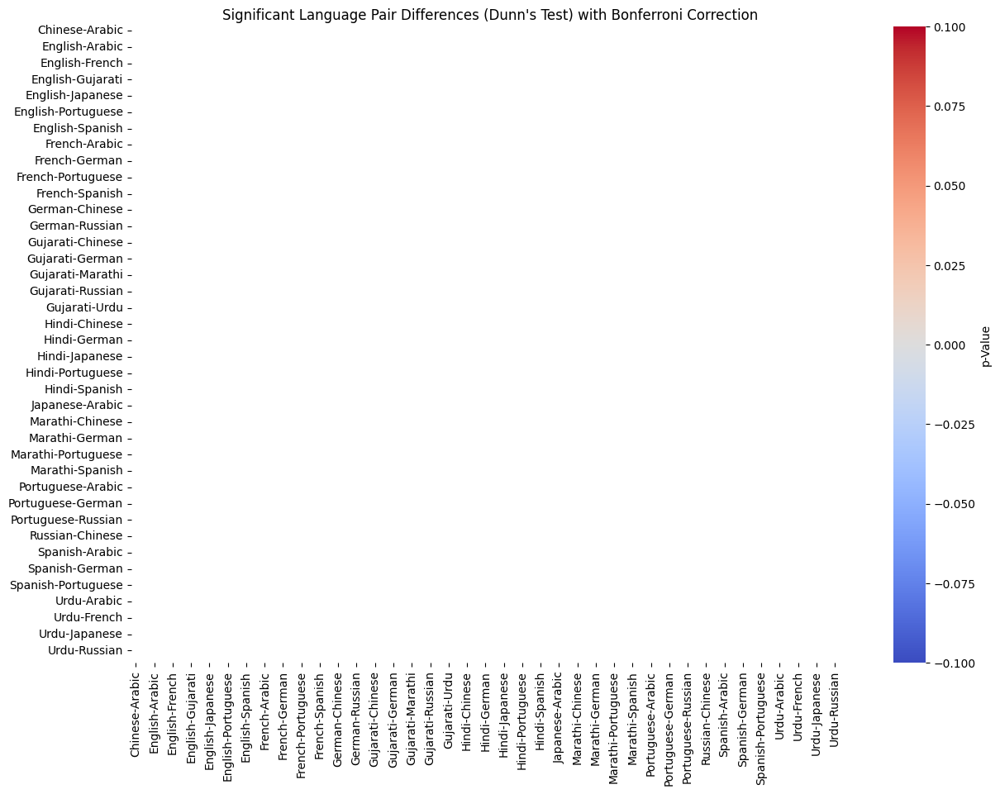

Significant Language Pair Differences (p < 0.05):
Empty DataFrame
Columns: [Language_Pair_1, Language_Pair_2, p-Value]
Index: []


In [ ]:
####
# To list the specific language pairs that show significant differences after the Kruskal-Wallis test,
# we can apply a post hoc Dunn’s test. This test will identify pairs with statistically significant
# differences by comparing each pair of language pairs individually, while controlling for multiple comparisons.


!pip install scikit-posthocs


import pandas as pd
from sentence_transformers import SentenceTransformer, util
import numpy as np
from scipy.stats import kruskal
from scikit_posthocs import posthoc_dunn
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Collect similarity data for each prompt
similarity_data = []

# Calculate embeddings and similarity matrices for each prompt
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j]
            })

# Convert similarity data to DataFrame
similarity_df = pd.DataFrame(similarity_data)

# Step 1: Aggregate similarity scores across prompts by language pair
similarity_means = similarity_df.groupby("Language_Pair")["Similarity_Score"].mean().reset_index()

# Step 2: Conduct Dunn's test for pairwise comparisons
# Prepare data for Dunn's test by grouping similarity scores by language pairs
dunn_test_result = posthoc_dunn(similarity_df, val_col="Similarity_Score", group_col="Language_Pair", p_adjust="bonferroni")

# Filter significant results (p-value < 0.05)
significant_pairs = dunn_test_result[dunn_test_result < 0.05]
print("Significant Language Pair Differences with Dunn's Test (p < 0.05):")
print(significant_pairs)

# Optional: Visualize significant differences heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(significant_pairs, annot=True, cmap="coolwarm", cbar_kws={'label': 'p-Value'})
plt.title("Significant Language Pair Differences (Dunn's Test) with Bonferroni Correction")
plt.show()


############### To generate a table format for the significant pairs from Dunn's test,
###############we can extract only the relevant pairs with p-values less than 0.05 and then display this data in a table format.

# Filter only significant pairs (p-value < 0.05)
significant_pairs_table = dunn_test_result.where(dunn_test_result < 0.05).stack().reset_index()
significant_pairs_table.columns = ['Language_Pair_1', 'Language_Pair_2', 'p-Value']

# Display the table of significant language pairs
print("Significant Language Pair Differences (p < 0.05):")
print(significant_pairs_table)



/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


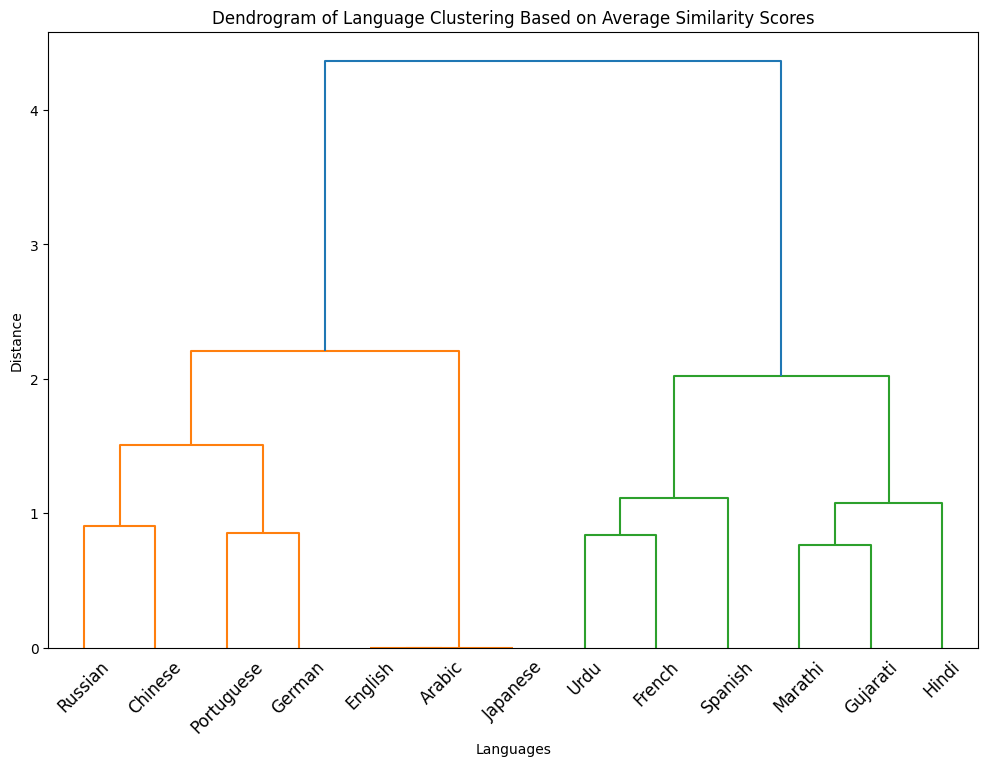

In [ ]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Collect similarity data for each prompt
similarity_data = []

# Calculate embeddings and similarity matrices
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    # Flatten matrix to store similarity scores between language pairs
    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            similarity_data.append({
                "Language_1": languages[i],
                "Language_2": languages[j],
                "Similarity_Score": similarity_matrix[i][j]
            })

# Convert similarity data to DataFrame
similarity_df = pd.DataFrame(similarity_data)

# Step 1: Aggregate by calculating the mean similarity score for each language pair
similarity_mean_df = similarity_df.groupby(["Language_1", "Language_2"])["Similarity_Score"].mean().reset_index()

# Step 2: Pivot to create a symmetric matrix
pivot_df = similarity_mean_df.pivot(index="Language_1", columns="Language_2", values="Similarity_Score")

# Fill missing values with 0 to ensure a fully populated matrix
pivot_df = pivot_df + pivot_df.T.fillna(0)
pivot_df = pivot_df.fillna(0)

# Step 3: Perform hierarchical clustering
linked = linkage(pivot_df.values, method='ward')

# Step 4: Plot dendrogram to visualize clusters
plt.figure(figsize=(12, 8))
dendrogram(linked, labels=pivot_df.index, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title("Dendrogram of Language Clustering Based on Average Similarity Scores")
plt.xlabel("Languages")
plt.ylabel("Distance")
plt.xticks(rotation=45)
plt.show()


In [ ]:
!sudo apt-get install libicu-dev
!pip install polyglot
!pip install pyicu
!pip install pycld2
!pip install morfessor

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libicu-dev is already the newest version (70.1-2).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for polyglot: filename=polyglot-16.7.4-py2.py3-none-any.whl size=52562 sha256=47352289d062588126fe7b682da7fa57849e0e6f7bdeac9969ab18c62a4161e9
  Stored in directory: /root/.cache/pip/wheels/aa/92/4a/b172589446ba537db3bdb9a1f2204f27fe71217981c14ac368
Successfully built polyglot
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.9/263.9 kB 15.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyicu: filename=PyICU-2.14-cp310-cp310-linux_x86_64.whl size=1809835 sha256=e6843158d452467932603650152c483217a718387d3bc9df53f96a078

In [ ]:
# Import polyglot's downloader
from polyglot.downloader import downloader

# List of language codes needed for sentiment analysis
language_codes = ["en", "hi", "gu", "mr", "ur", "fr", "es", "pt", "de", "ru", "zh", "ja", "ar"]

# Download sentiment lexicons for each language
for code in language_codes:
    downloader.download(f"sentiment2.{code}")


[polyglot_data] Downloading package sentiment2.en to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.hi to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.gu to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.mr to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.ur to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.fr to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.es to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.pt to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.de to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sentiment2.ru to
[polyglot_data]     /root/polyglot_data...
[polyglot_data] Downloading package sent

In [ ]:
import pandas as pd
from polyglot.text import Text

# Load the Excel file
df = pd.read_excel("modified_results.xlsx")

# Define the languages and columns
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Initialize dictionaries to store polarity scores and sentiment ratios
polarity_scores = {}
sentiment_ratios = {}

def analyze_sentiment(text):
    """Calculate Average Polarity Score and Sentiment Ratio using Polyglot."""
    text_obj = Text(text)
    pos_count = sum(1 for word in text_obj.words if word.polarity > 0)
    neg_count = sum(1 for word in text_obj.words if word.polarity < 0)
    total_words = len(text_obj.words)

    avg_polarity = sum(word.polarity for word in text_obj.words) / total_words if total_words else 0
    pos_ratio = pos_count / total_words if total_words else 0
    neg_ratio = neg_count / total_words if total_words else 0
    return avg_polarity, pos_ratio, neg_ratio

# Loop through each prompt and response
for prompt_id in df['Prompt_ID'].unique():
    polarity_scores[prompt_id] = {}
    sentiment_ratios[prompt_id] = {}

    for lang in languages:
        response_text = df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0]
        avg_polarity, pos_ratio, neg_ratio = analyze_sentiment(response_text)

        # Store the results in dictionaries
        polarity_scores[prompt_id][lang] = avg_polarity
        sentiment_ratios[prompt_id][lang] = {"Positivity": pos_ratio, "Negativity": neg_ratio}

# Convert the results into DataFrames
polarity_df = pd.DataFrame(polarity_scores).T
positivity_df = pd.DataFrame({k: {lang: v['Positivity'] for lang, v in val.items()} for k, val in sentiment_ratios.items()})
negativity_df = pd.DataFrame({k: {lang: v['Negativity'] for lang, v in val.items()} for k, val in sentiment_ratios.items()})

# Save results to an Excel file
with pd.ExcelWriter("polyglot_sentiment_analysis_results.xlsx") as writer:
    polarity_df.to_excel(writer, sheet_name="Average_Polarity_Scores")
    positivity_df.to_excel(writer, sheet_name="Positivity_Ratios")
    negativity_df.to_excel(writer, sheet_name="Negativity_Ratios")

print("Sentiment analysis results saved to 'polyglot_sentiment_analysis_results.xlsx'")


Sentiment analysis results saved to 'polyglot_sentiment_analysis_results.xlsx'


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


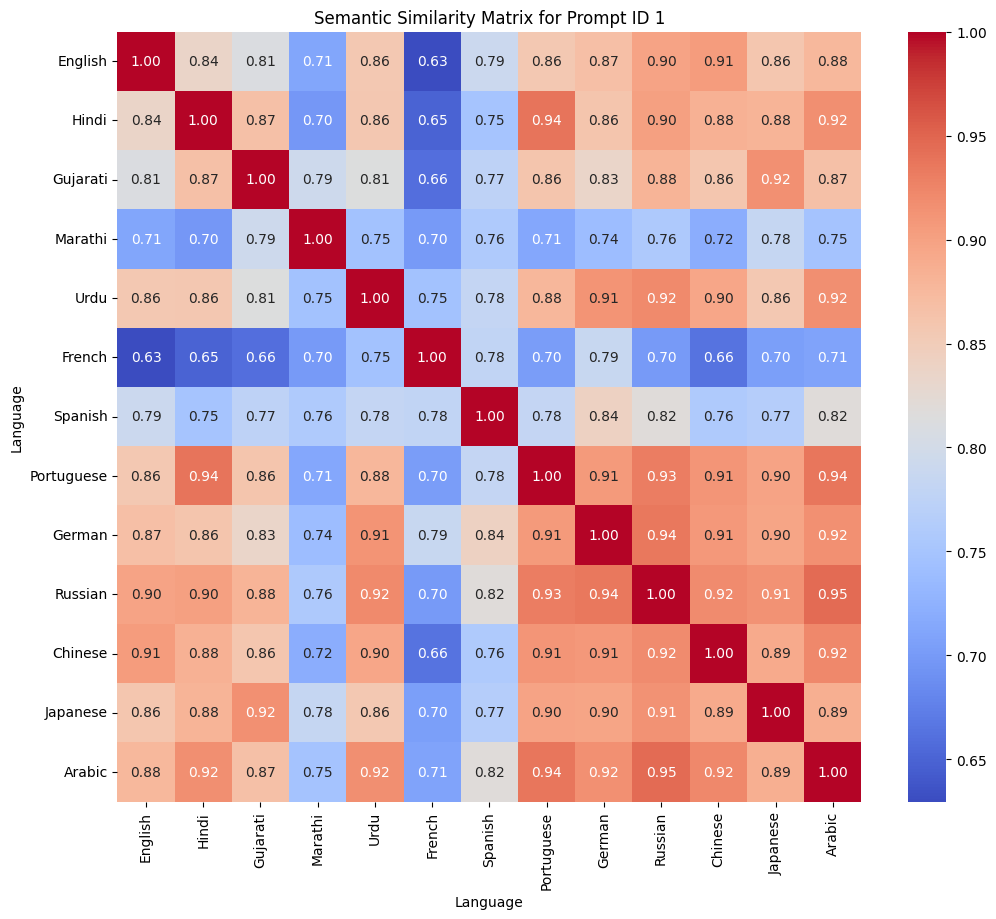

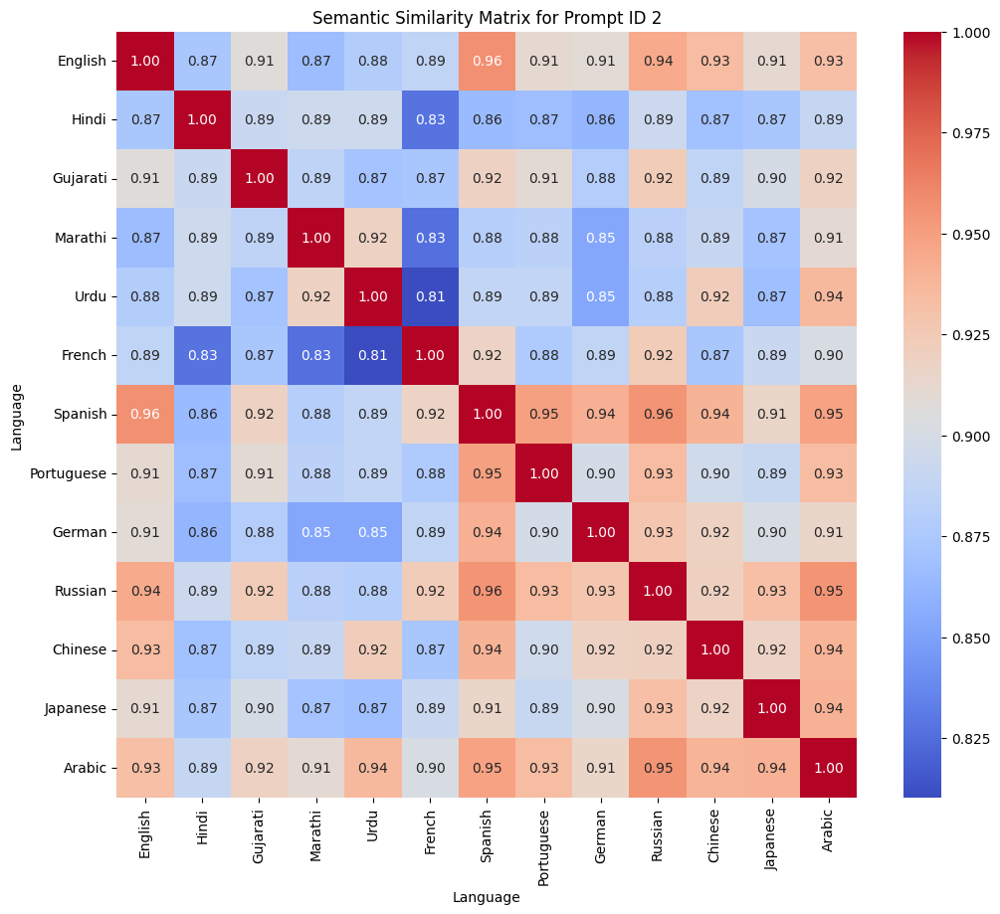

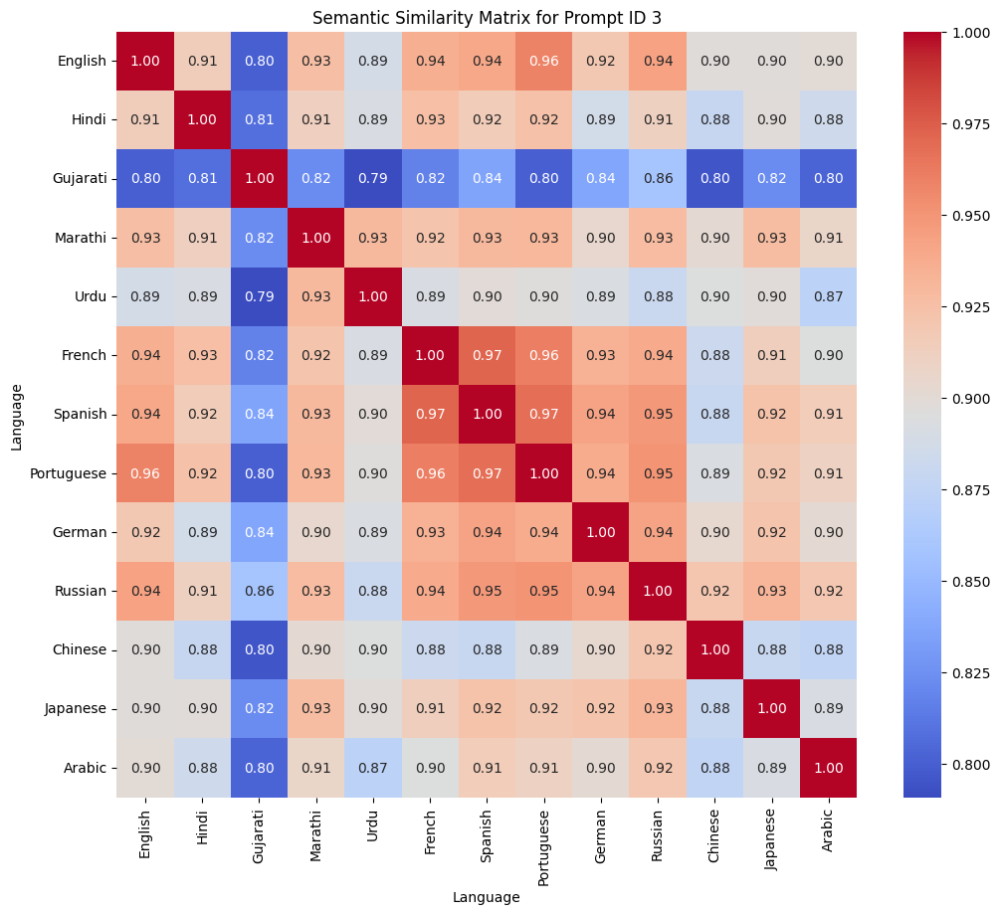

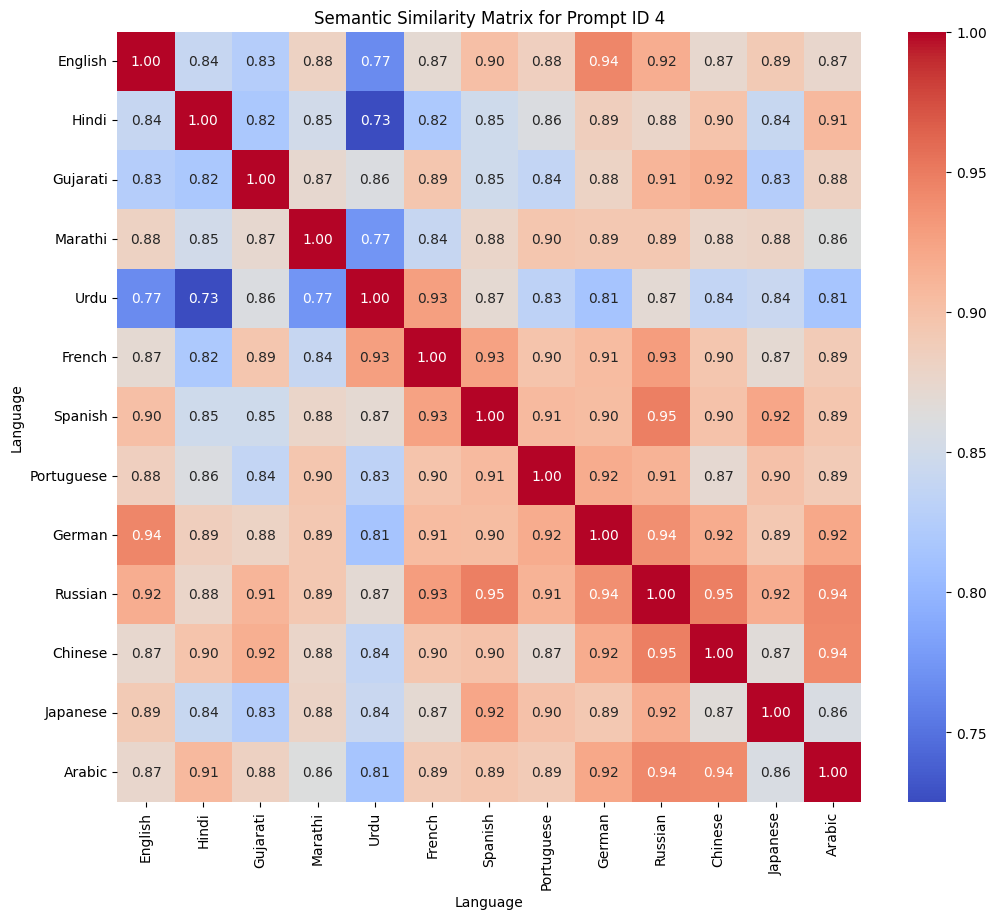

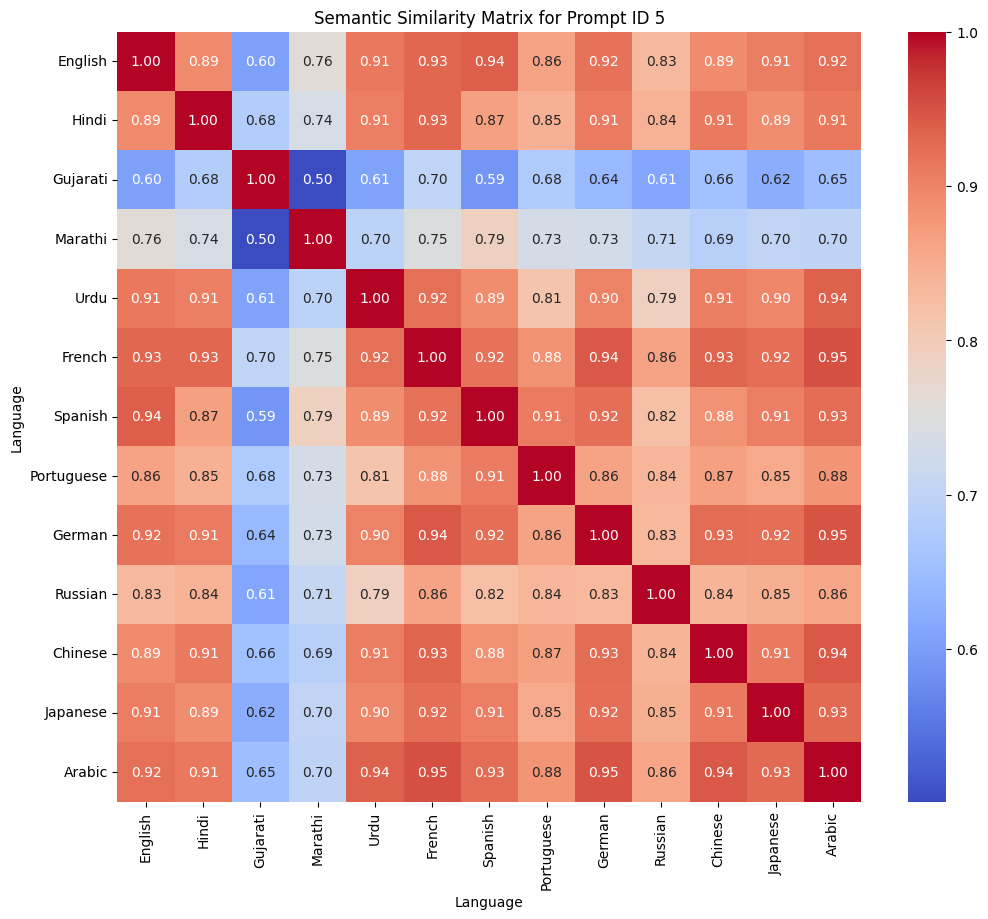

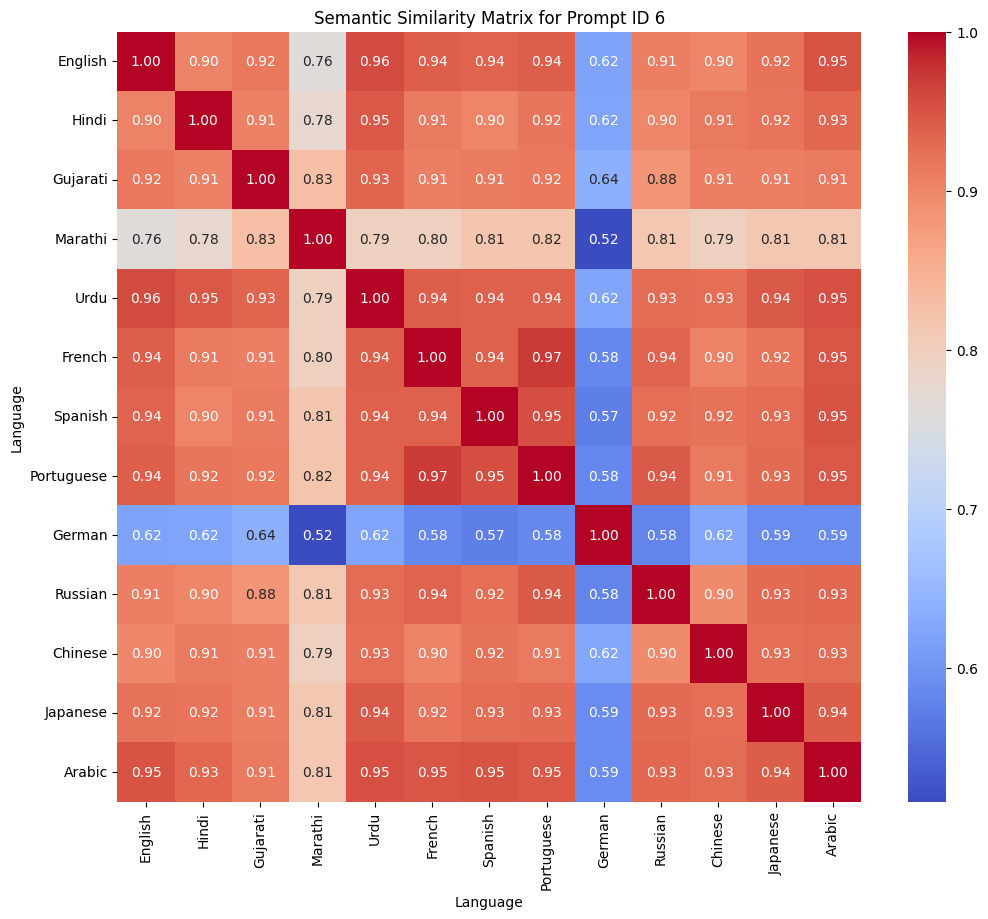

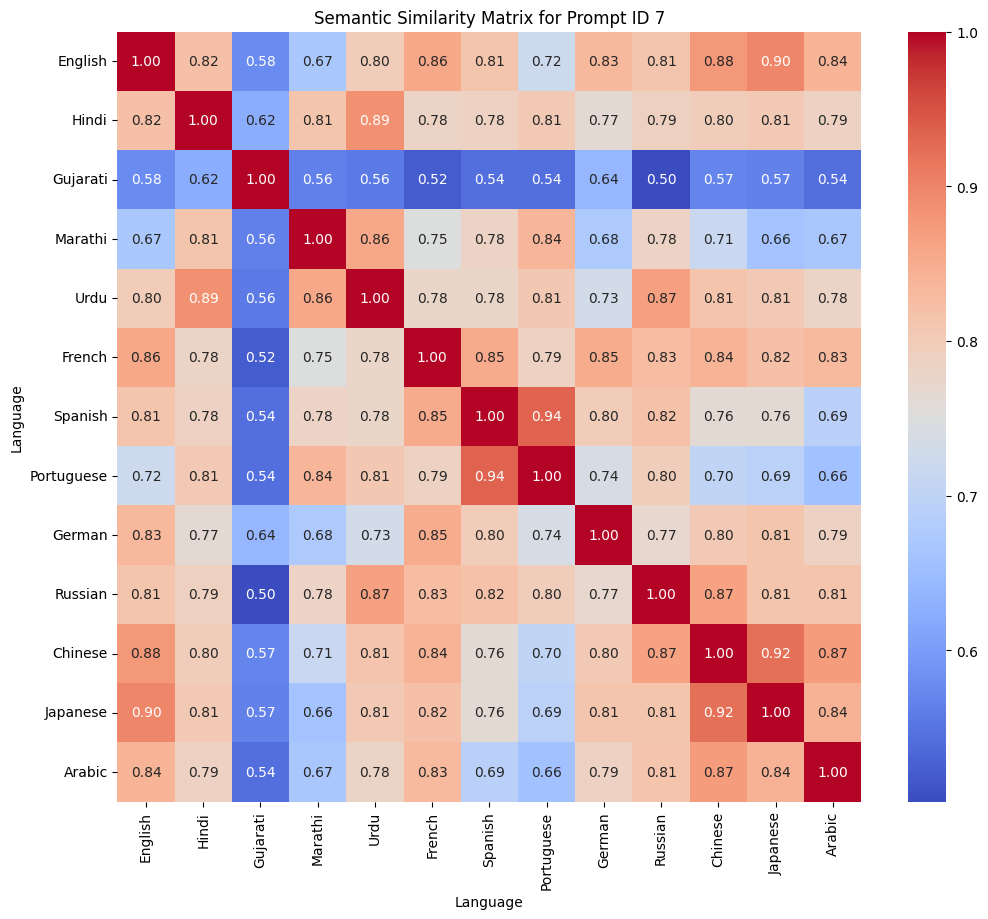

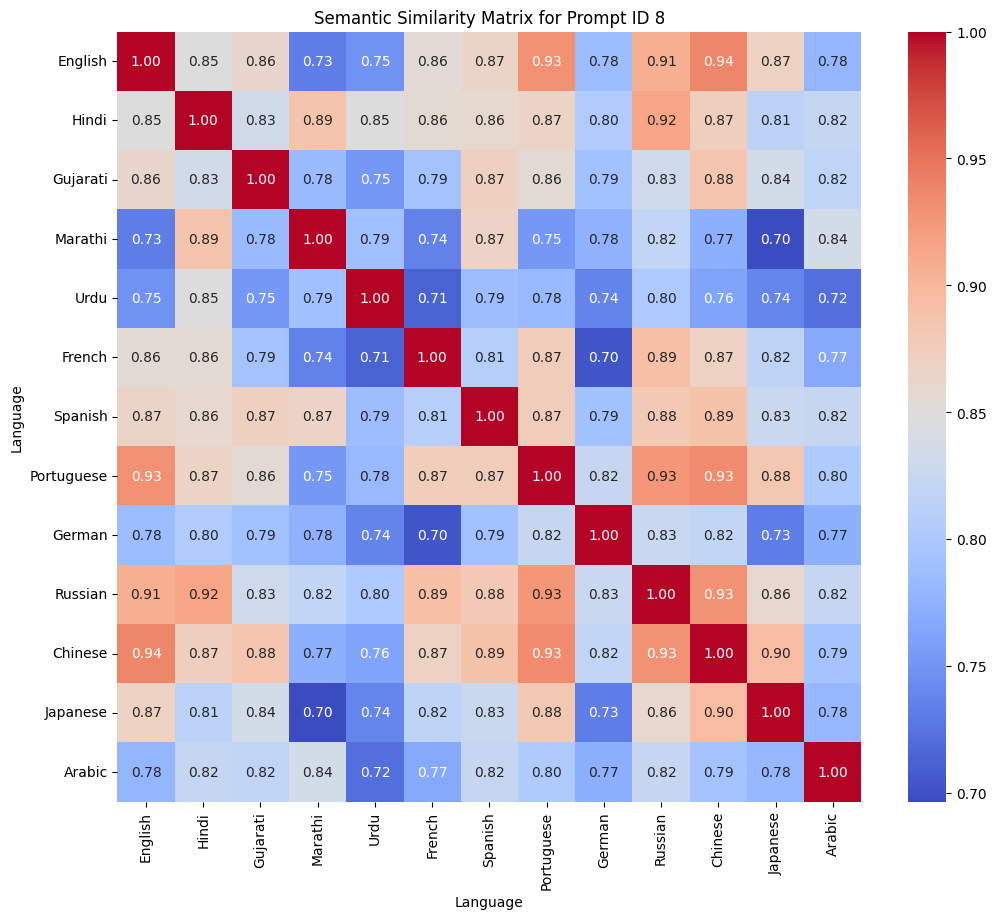

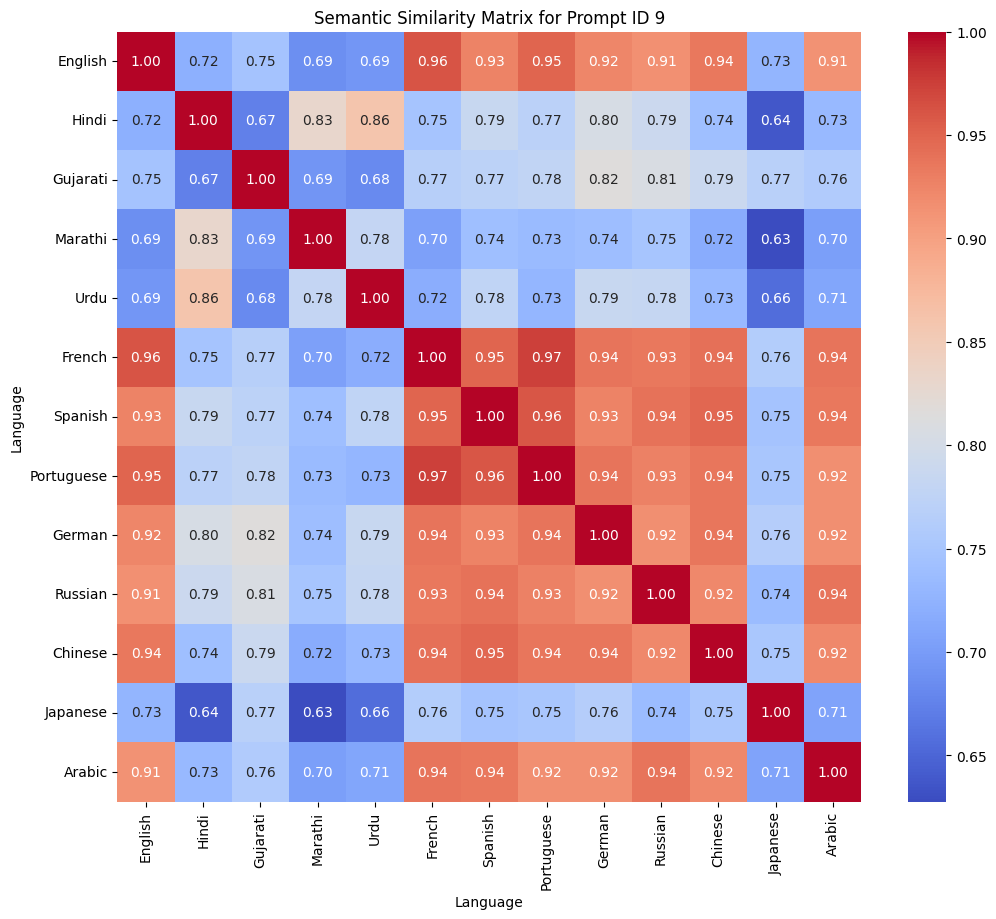

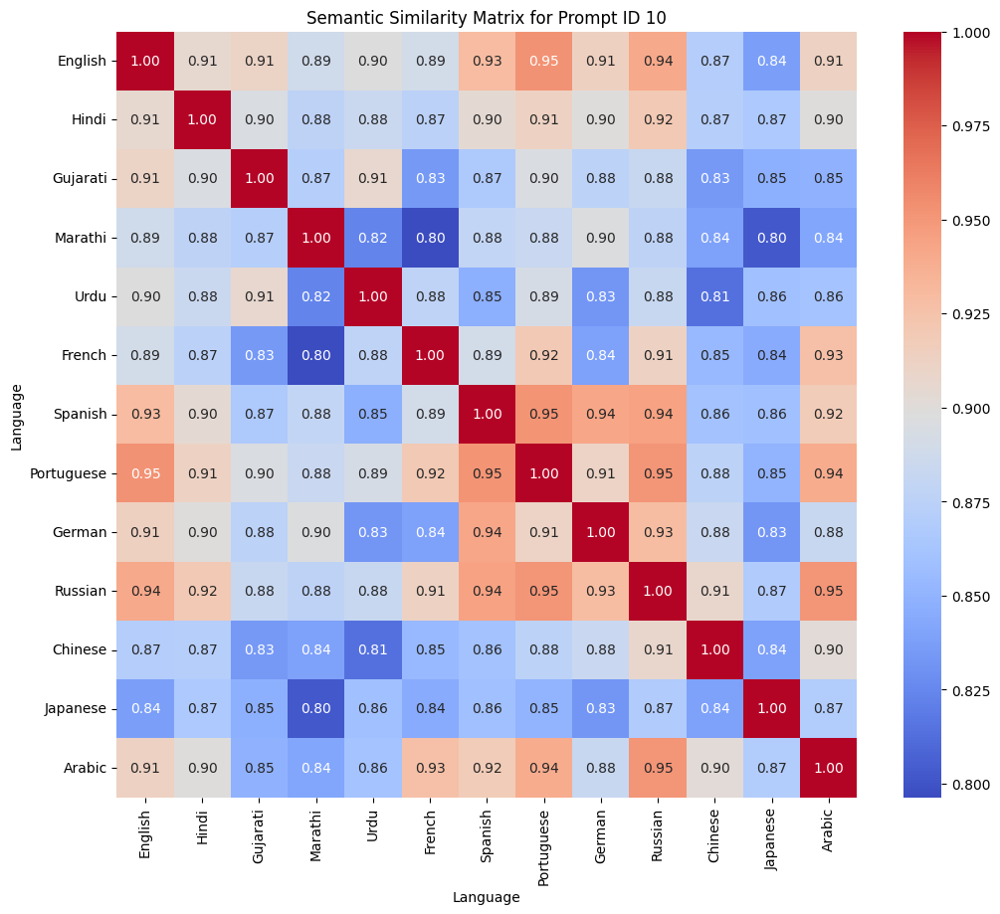

In [ ]:
# Assuming you've set up your Google Colab environment and have the necessary libraries installed
from sentence_transformers import SentenceTransformer, util
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
df = pd.read_excel("modified_results.xlsx")

# Define the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Initialize dictionary to store similarity matrices for each prompt
similarity_matrices = {}

# Calculate embeddings and similarity matrices
for prompt_id in df['Prompt_ID'].unique():
    # Extract responses for the current prompt in each language
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]

    # Calculate embeddings for each language response
    embeddings = model.encode(responses, convert_to_tensor=True)

    # Compute pairwise cosine similarity matrix
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()
    similarity_matrices[prompt_id] = similarity_matrix

    # Plot similarity matrix for each prompt
    plt.figure(figsize=(12, 10))
    sns.heatmap(similarity_matrix, annot=True, xticklabels=languages, yticklabels=languages, cmap="coolwarm", fmt=".2f")
    plt.title(f"Semantic Similarity Matrix for Prompt ID {prompt_id}")
    plt.xlabel("Language")
    plt.ylabel("Language")
    plt.show()


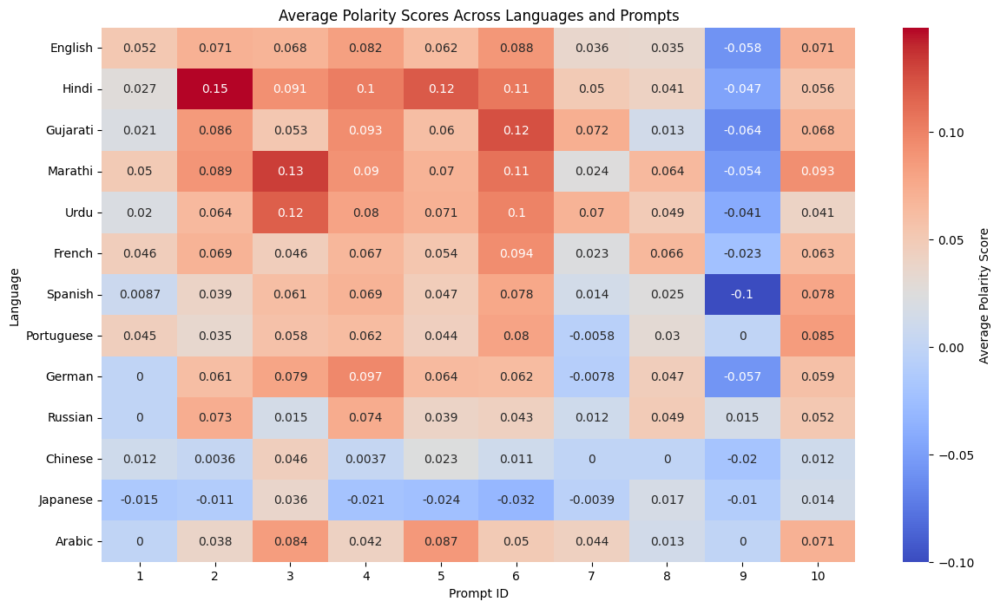

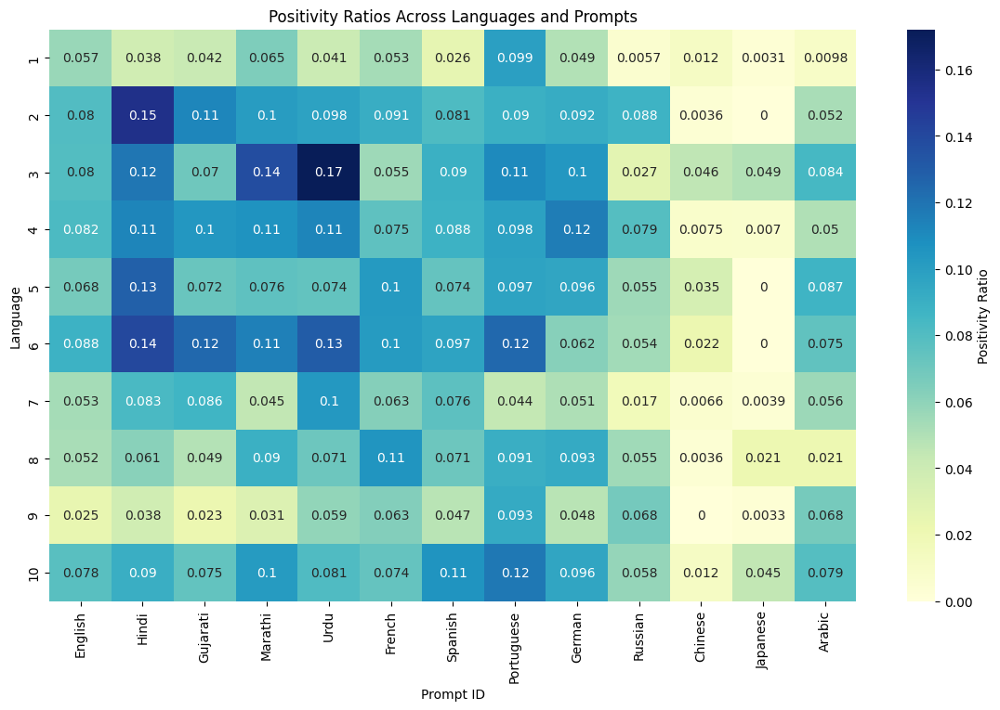

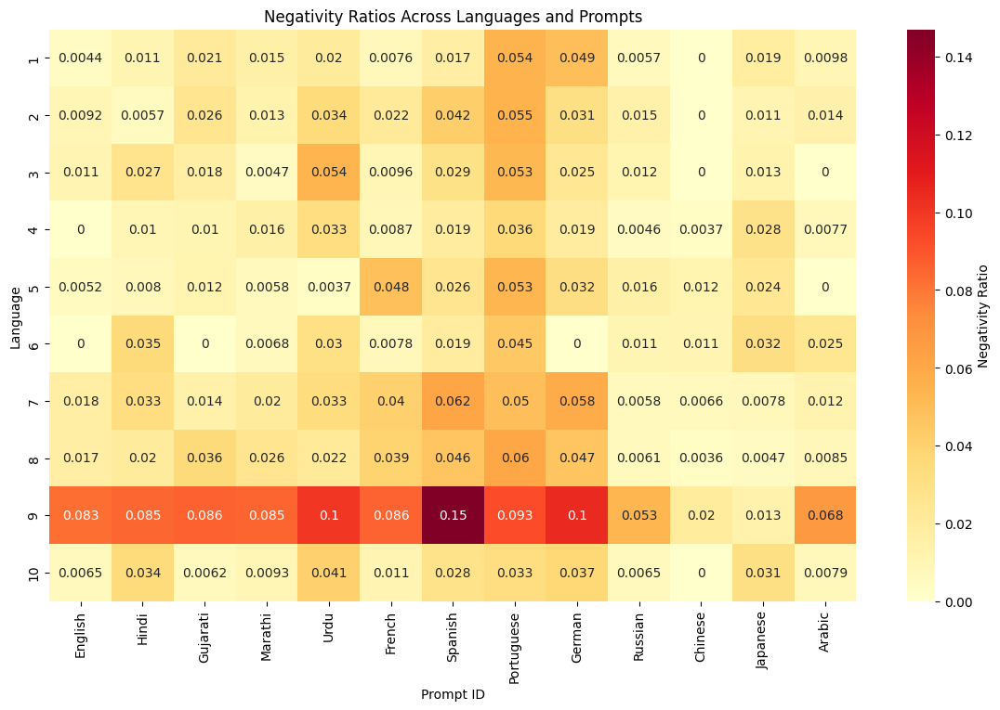

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure polarity_df, positivity_df, and negativity_df are transposed for consistent visualization format
polarity_df = polarity_df.T  # Transpose for visualization
positivity_df = positivity_df.T
negativity_df = negativity_df.T

# Visualize Average Polarity Scores
plt.figure(figsize=(14, 8))
sns.heatmap(polarity_df, annot=True, cmap="coolwarm", cbar_kws={'label': 'Average Polarity Score'})
plt.title("Average Polarity Scores Across Languages and Prompts")
plt.xlabel("Prompt ID")
plt.ylabel("Language")
plt.show()

# Visualize Positivity Ratios
plt.figure(figsize=(14, 8))
sns.heatmap(positivity_df, annot=True, cmap="YlGnBu", cbar_kws={'label': 'Positivity Ratio'})
plt.title("Positivity Ratios Across Languages and Prompts")
plt.xlabel("Prompt ID")
plt.ylabel("Language")
plt.show()

# Visualize Negativity Ratios
plt.figure(figsize=(14, 8))
sns.heatmap(negativity_df, annot=True, cmap="YlOrRd", cbar_kws={'label': 'Negativity Ratio'})
plt.title("Negativity Ratios Across Languages and Prompts")
plt.xlabel("Prompt ID")
plt.ylabel("Language")
plt.show()


In [ ]:
print("Polarity DataFrame columns:", polarity_df.columns)
print("Positivity DataFrame columns:", positivity_df.columns)
print("Negativity DataFrame columns:", negativity_df.columns)


Polarity DataFrame columns: Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], dtype='int64')
Positivity DataFrame columns: Index(['English', 'Hindi', 'Gujarati', 'Marathi', 'Urdu', 'French', 'Spanish',
       'Portuguese', 'German', 'Russian', 'Chinese', 'Japanese', 'Arabic'],
      dtype='object')
Negativity DataFrame columns: Index(['English', 'Hindi', 'Gujarati', 'Marathi', 'Urdu', 'French', 'Spanish',
       'Portuguese', 'German', 'Russian', 'Chinese', 'Japanese', 'Arabic'],
      dtype='object')


In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Load the Excel file and examine each sheet
file_path = 'polyglot_sentiment_analysis_results.xlsx'
polarity_df = pd.read_excel(file_path, sheet_name="Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = pd.read_excel(file_path, sheet_name="Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = pd.read_excel(file_path, sheet_name="Negativity_Ratios").set_index("Unnamed: 0")

# Define language list from the columns in the Polarity DataFrame
languages = polarity_df.columns.tolist()
prompt_ids = [int(col) for col in positivity_df.columns]

# Detailed ANOVA for Average Polarity Score by Language
print("\nANOVA for Average Polarity Score by Language")
polarity_long_df = pd.melt(polarity_df.reset_index(), id_vars=['index'], value_vars=languages,
                           var_name="Language", value_name="Polarity_Score")

model_polarity = ols('Polarity_Score ~ C(Language)', data=polarity_long_df).fit()
anova_table_polarity = sm.stats.anova_lm(model_polarity, typ=2)
eta_squared_polarity = anova_table_polarity['sum_sq'] / anova_table_polarity['sum_sq'].sum()

print(anova_table_polarity)
print(f"\nEffect Size (Eta Squared) for Average Polarity Score: {eta_squared_polarity['C(Language)']:.3f}")

# Detailed ANOVA for Positivity Ratio by Prompt ID
print("\nANOVA for Positivity Ratio by Prompt ID")
positivity_long_df = pd.melt(positivity_df.reset_index(), id_vars=['Unnamed: 0'], value_vars=prompt_ids,
                             var_name="Prompt_ID", value_name="Positivity_Ratio")

model_positivity = ols('Positivity_Ratio ~ C(Prompt_ID)', data=positivity_long_df).fit()
anova_table_positivity = sm.stats.anova_lm(model_positivity, typ=2)
eta_squared_positivity = anova_table_positivity['sum_sq'] / anova_table_positivity['sum_sq'].sum()

print(anova_table_positivity)
print(f"\nEffect Size (Eta Squared) for Positivity Ratio: {eta_squared_positivity['C(Prompt_ID)']:.3f}")

# Detailed ANOVA for Negativity Ratio by Prompt ID
print("\nANOVA for Negativity Ratio by Prompt ID")
negativity_long_df = pd.melt(negativity_df.reset_index(), id_vars=['Unnamed: 0'], value_vars=prompt_ids,
                             var_name="Prompt_ID", value_name="Negativity_Ratio")

model_negativity = ols('Negativity_Ratio ~ C(Prompt_ID)', data=negativity_long_df).fit()
anova_table_negativity = sm.stats.anova_lm(model_negativity, typ=2)
eta_squared_negativity = anova_table_negativity['sum_sq'] / anova_table_negativity['sum_sq'].sum()

print(anova_table_negativity)
print(f"\nEffect Size (Eta Squared) for Negativity Ratio: {eta_squared_negativity['C(Prompt_ID)']:.3f}")

# Chi-Square Test for Semantic Similarity (if similarity matrices available)
# Placeholder code for similarity_matrices if structured appropriately for testing
similarity_matrices = {prompt_id: np.random.rand(len(languages), len(languages)) for prompt_id in prompt_ids}

# Flatten and bin similarity data for Chi-Square Test
chi_square_data = np.concatenate([np.digitize(matrix.flatten(), bins=[0.33, 0.66]) for matrix in similarity_matrices.values()]).reshape(-1, len(languages))
chi2_stat, p_val, dof, expected = chi2_contingency(chi_square_data)

print("\nChi-Square Test Results for Semantic Similarity:")
print("---------------------------------------------------")
print(f"Chi2 Statistic: {chi2_stat}")
print(f"Degrees of Freedom: {dof}")
print(f"p-Value: {p_val}")
print("---------------------------------------------------")

# Interpretation of Chi-Square Test Result
if p_val < 0.05:
    print("\nInterpretation: Chi-Sqaure results: Significant differences detected, suggesting variability in semantic similarity patterns across prompts.")
else:
    print("\nInterpretation: Chi-Square results: No significant differences in semantic similarity patterns across prompts.")



ANOVA for Average Polarity Score by Language
               sum_sq     df         F    PR(>F)
C(Language)  0.052858   12.0  2.636594  0.003724
Residual     0.195467  117.0       NaN       NaN

Effect Size (Eta Squared) for Average Polarity Score: 0.213

ANOVA for Positivity Ratio by Prompt ID
                sum_sq     df         F    PR(>F)
C(Prompt_ID)  0.038414    9.0  3.620707  0.000504
Residual      0.141459  120.0       NaN       NaN

Effect Size (Eta Squared) for Positivity Ratio: 0.214

ANOVA for Negativity Ratio by Prompt ID
                sum_sq     df          F        PR(>F)
C(Prompt_ID)  0.041652    9.0  12.755179  4.588938e-14
Residual      0.043540  120.0        NaN           NaN

Effect Size (Eta Squared) for Negativity Ratio: 0.489

Chi-Square Test Results for Semantic Similarity:
---------------------------------------------------
Chi2 Statistic: 1113.1117143117378
Degrees of Freedom: 1548
p-Value: 1.0
---------------------------------------------------

Interpretat

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Load the Excel file and examine each sheet
file_path = 'polyglot_sentiment_analysis_results.xlsx'
polarity_df = pd.read_excel(file_path, sheet_name="Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = pd.read_excel(file_path, sheet_name="Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = pd.read_excel(file_path, sheet_name="Negativity_Ratios").set_index("Unnamed: 0")

# Define language list from the columns in the Polarity DataFrame
languages = polarity_df.columns.tolist()
prompt_ids = [int(col) for col in positivity_df.columns]

# 1. Average Polarity Score Analysis by Language
print("\nAverage Polarity Score Analysis by Language")
polarity_long_df = pd.melt(polarity_df.reset_index(), id_vars=['index'], value_vars=languages,
                           var_name="Language", value_name="Polarity_Score")

# Descriptive Statistics for Polarity
polarity_desc = polarity_long_df.groupby("Language")["Polarity_Score"].agg(['mean', 'std'])
print("Descriptive Statistics for Average Polarity Score by Language:")
print(polarity_desc)

# Perform ANOVA
model_polarity = ols('Polarity_Score ~ C(Language)', data=polarity_long_df).fit()
anova_table_polarity = sm.stats.anova_lm(model_polarity, typ=2)
eta_squared_polarity = anova_table_polarity['sum_sq'] / anova_table_polarity['sum_sq'].sum()

print("\nANOVA Table for Average Polarity Score by Language:")
print(anova_table_polarity)
print(f"Effect Size (Eta Squared) for Average Polarity Score: {eta_squared_polarity['C(Language)']:.3f}")

# 2. Positivity Ratio Analysis by Prompt ID
print("\nPositivity Ratio Analysis by Prompt ID")
positivity_long_df = pd.melt(positivity_df.reset_index(), id_vars=['Unnamed: 0'], value_vars=prompt_ids,
                             var_name="Prompt_ID", value_name="Positivity_Ratio")

# Descriptive Statistics for Positivity Ratio
positivity_desc = positivity_long_df.groupby("Prompt_ID")["Positivity_Ratio"].agg(['mean', 'std'])
print("Descriptive Statistics for Positivity Ratio by Prompt ID:")
print(positivity_desc)

# Perform ANOVA
model_positivity = ols('Positivity_Ratio ~ C(Prompt_ID)', data=positivity_long_df).fit()
anova_table_positivity = sm.stats.anova_lm(model_positivity, typ=2)
eta_squared_positivity = anova_table_positivity['sum_sq'] / anova_table_positivity['sum_sq'].sum()

print("\nANOVA Table for Positivity Ratio by Prompt ID:")
print(anova_table_positivity)
print(f"Effect Size (Eta Squared) for Positivity Ratio: {eta_squared_positivity['C(Prompt_ID)']:.3f}")

# 3. Negativity Ratio Analysis by Prompt ID
print("\nNegativity Ratio Analysis by Prompt ID")
negativity_long_df = pd.melt(negativity_df.reset_index(), id_vars=['Unnamed: 0'], value_vars=prompt_ids,
                             var_name="Prompt_ID", value_name="Negativity_Ratio")

# Descriptive Statistics for Negativity Ratio
negativity_desc = negativity_long_df.groupby("Prompt_ID")["Negativity_Ratio"].agg(['mean', 'std'])
print("Descriptive Statistics for Negativity Ratio by Prompt ID:")
print(negativity_desc)

# Perform ANOVA
model_negativity = ols('Negativity_Ratio ~ C(Prompt_ID)', data=negativity_long_df).fit()
anova_table_negativity = sm.stats.anova_lm(model_negativity, typ=2)
eta_squared_negativity = anova_table_negativity['sum_sq'] / anova_table_negativity['sum_sq'].sum()

print("\nANOVA Table for Negativity Ratio by Prompt ID:")
print(anova_table_negativity)
print(f"Effect Size (Eta Squared) for Negativity Ratio: {eta_squared_negativity['C(Prompt_ID)']:.3f}")



Average Polarity Score Analysis by Language
Descriptive Statistics for Average Polarity Score by Language:
                mean       std
Language                      
Arabic      0.042821  0.031724
Chinese     0.009087  0.017018
English     0.050848  0.042117
French      0.050348  0.031701
German      0.040299  0.047073
Gujarati    0.052784  0.052400
Hindi       0.069499  0.056203
Japanese   -0.005093  0.021204
Marathi     0.066643  0.052176
Portuguese  0.043412  0.030246
Russian     0.037250  0.025972
Spanish     0.032057  0.052772
Urdu        0.057171  0.044463

ANOVA Table for Average Polarity Score by Language:
               sum_sq     df         F    PR(>F)
C(Language)  0.052858   12.0  2.636594  0.003724
Residual     0.195467  117.0       NaN       NaN
Effect Size (Eta Squared) for Average Polarity Score: 0.213

Positivity Ratio Analysis by Prompt ID
Descriptive Statistics for Positivity Ratio by Prompt ID:
               mean       std
Prompt_ID                    
1        

Descriptive Statistics - Average Polarity Score:
                 mean       std       min       25%       50%       75%  \
English     0.050848  0.042117 -0.057851  0.039767  0.065341  0.071264   
Hindi       0.069499  0.056203 -0.047170  0.043186  0.073736  0.104588   
Gujarati    0.052784  0.052400 -0.063636  0.028950  0.064282  0.082130   
Marathi     0.066643  0.052176 -0.054264  0.053526  0.079188  0.092051   
Urdu        0.057171  0.044463 -0.040909  0.042634  0.066924  0.077658   
French      0.050348  0.031701 -0.022624  0.045705  0.058247  0.066447   
Spanish     0.032057  0.052772 -0.100000  0.016942  0.043369  0.067096   
Portuguese  0.043412  0.030246 -0.005848  0.031336  0.044549  0.061387   
German      0.040299  0.047073 -0.057143  0.011628  0.059790  0.063396   
Russian     0.037250  0.025972  0.000000  0.015015  0.041424  0.051156   
Chinese     0.009087  0.017018 -0.019737  0.000906  0.007421  0.011617   
Japanese   -0.005093  0.021204 -0.031646 -0.019715 -0.010635  

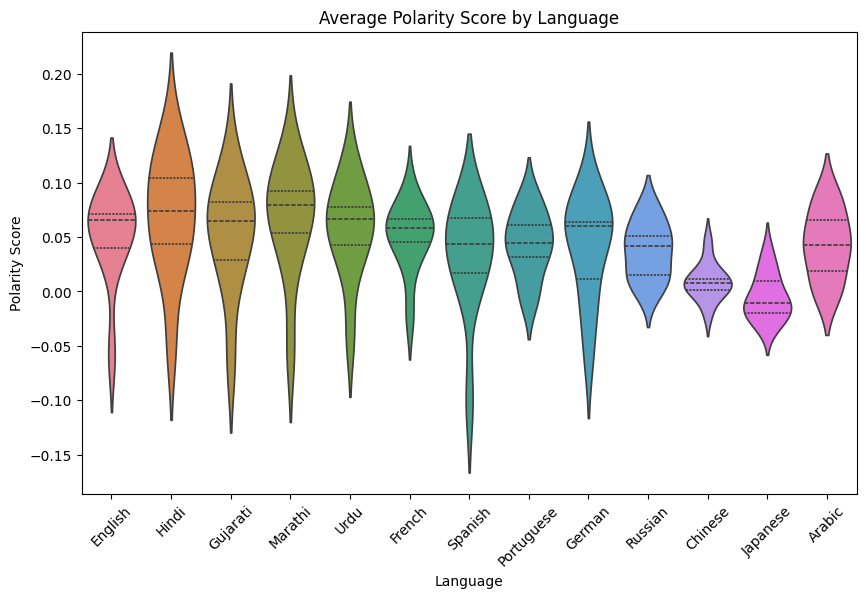

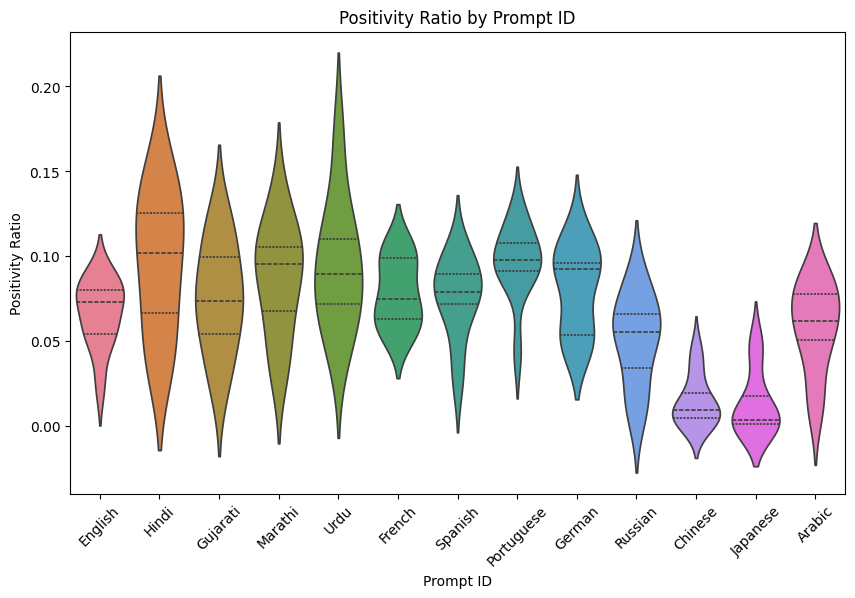

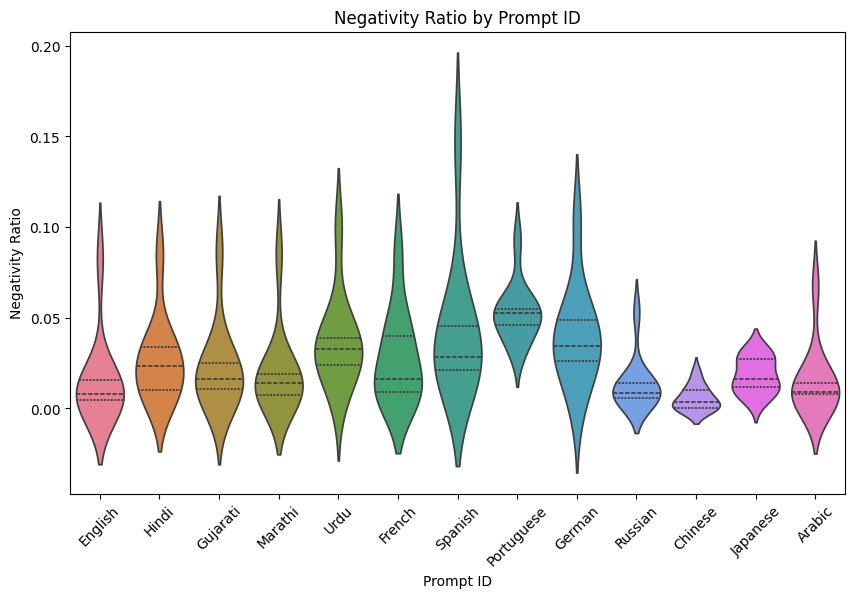

In [ ]:
# Revised code to display descriptive tables and use violin plots for visualization

import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file and obtain the descriptive statistics for each metric
file_path = 'polyglot_sentiment_analysis_results.xlsx'
polarity_df = pd.read_excel(file_path, sheet_name="Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = pd.read_excel(file_path, sheet_name="Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = pd.read_excel(file_path, sheet_name="Negativity_Ratios").set_index("Unnamed: 0")

# Calculate descriptive statistics for each metric
polarity_desc = polarity_df.describe().T[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]
positivity_desc = positivity_df.describe().T[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]
negativity_desc = negativity_df.describe().T[['mean', 'std', 'min', '25%', '50%', '75%', 'max']]

# Display summary tables for each metric
print("Descriptive Statistics - Average Polarity Score:\n", polarity_desc)
print("\nDescriptive Statistics - Positivity Ratio:\n", positivity_desc)
print("\nDescriptive Statistics - Negativity Ratio:\n", negativity_desc)

# Plot each violin plot separately for clarity

# Violin plot for Average Polarity Score by Language
plt.figure(figsize=(10, 6))
sns.violinplot(data=polarity_df, inner="quartile")
plt.title('Average Polarity Score by Language')
plt.xlabel('Language')
plt.ylabel('Polarity Score')
plt.xticks(rotation=45)
plt.show()

# Violin plot for Positivity Ratio by Prompt ID
plt.figure(figsize=(10, 6))
sns.violinplot(data=positivity_df.T, inner="quartile")
plt.title('Positivity Ratio by Prompt ID')
plt.xlabel('Prompt ID')
plt.ylabel('Positivity Ratio')
plt.xticks(rotation=45)
plt.show()

# Violin plot for Negativity Ratio by Prompt ID
plt.figure(figsize=(10, 6))
sns.violinplot(data=negativity_df.T, inner="quartile")
plt.title('Negativity Ratio by Prompt ID')
plt.xlabel('Prompt ID')
plt.ylabel('Negativity Ratio')
plt.xticks(rotation=45)
plt.show()


Descriptive Statistics - Average Polarity Scores
         English      Hindi   Gujarati    Marathi       Urdu     French  \
count  10.000000  10.000000  10.000000  10.000000  10.000000  10.000000   
mean    0.050848   0.069499   0.052784   0.066643   0.057171   0.050348   
std     0.042117   0.056203   0.052400   0.052176   0.044463   0.031701   
min    -0.057851  -0.047170  -0.063636  -0.054264  -0.040909  -0.022624   
25%     0.039767   0.043186   0.028950   0.053526   0.042634   0.045705   
50%     0.065341   0.073736   0.064282   0.079188   0.066924   0.058247   
75%     0.071264   0.104588   0.082130   0.092051   0.077658   0.066447   
max     0.088235   0.148571   0.125000   0.132701   0.118280   0.093750   

         Spanish  Portuguese     German    Russian    Chinese   Japanese  \
count  10.000000   10.000000  10.000000  10.000000  10.000000  10.000000   
mean    0.032057    0.043412   0.040299   0.037250   0.009087  -0.005093   
std     0.052772    0.030246   0.047073   0.025

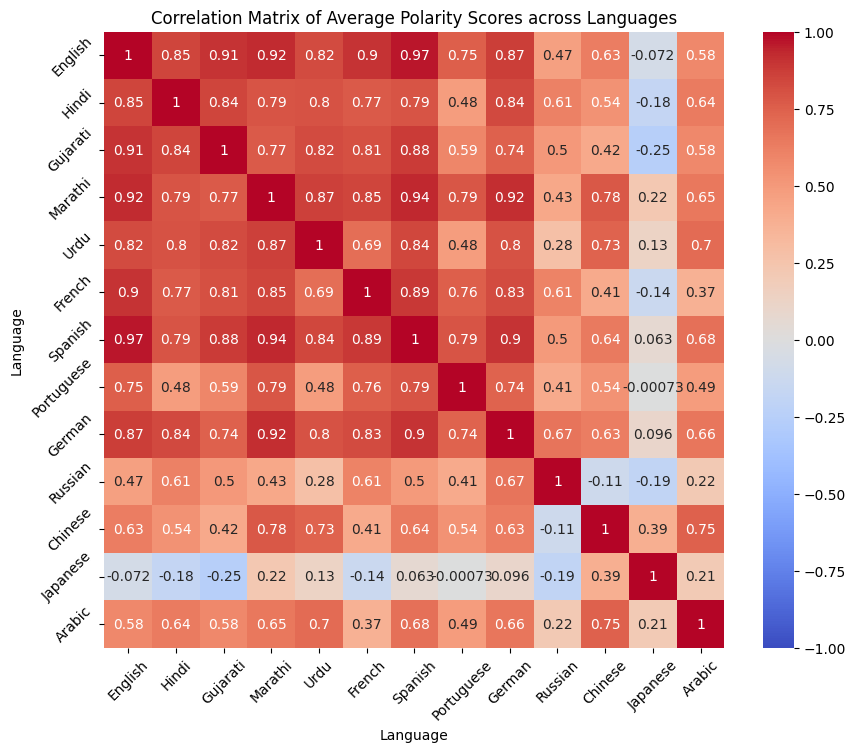

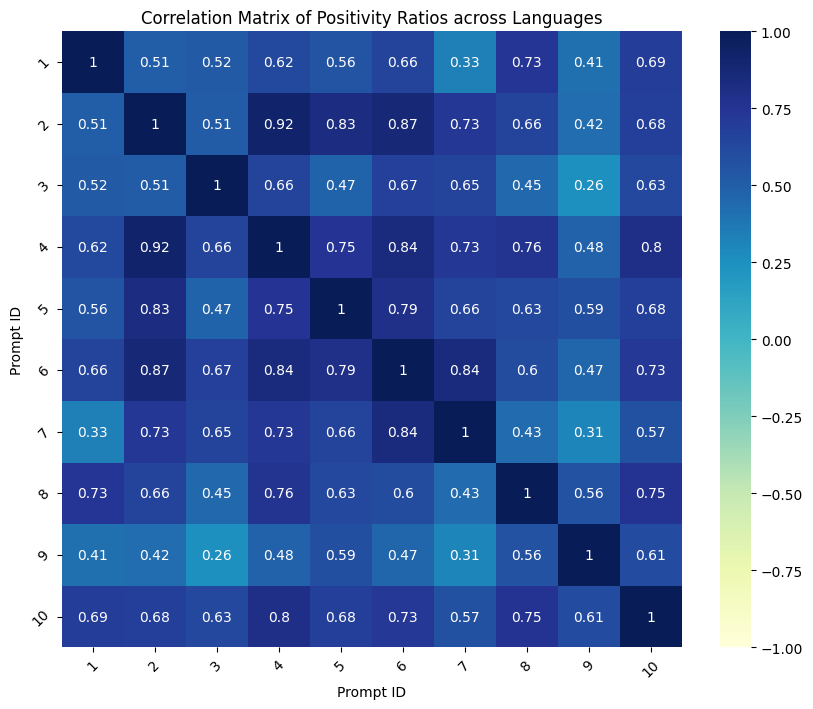

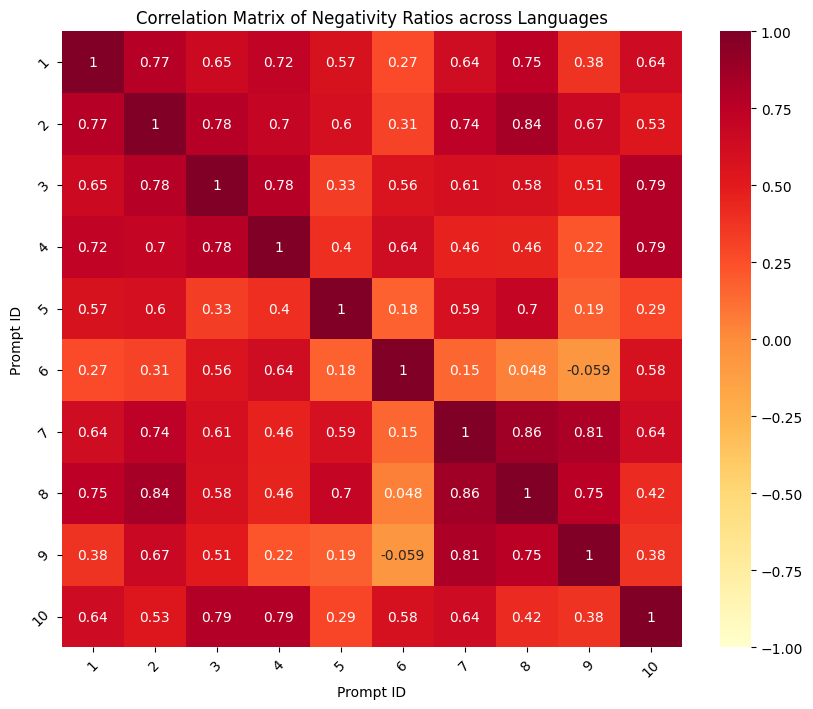

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Descriptive Analysis - Display summary statistics for each sheet
print("Descriptive Statistics - Average Polarity Scores")
print(polarity_df.describe())

print("\nDescriptive Statistics - Positivity Ratios")
print(positivity_df.describe())

print("\nDescriptive Statistics - Negativity Ratios")
print(negativity_df.describe())

# 1. Correlation Matrix for Average Polarity Scores across languages
polarity_corr = polarity_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(polarity_corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Average Polarity Scores across Languages")
plt.xlabel("Language")
plt.ylabel("Language")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

# 2. Correlation Matrix for Positivity Ratios across languages
positivity_corr = positivity_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(positivity_corr, annot=True, cmap="YlGnBu", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Positivity Ratios across Languages")
plt.xlabel("Prompt ID")
plt.ylabel("Prompt ID")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

# 3. Correlation Matrix for Negativity Ratios across languages
negativity_corr = negativity_df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(negativity_corr, annot=True, cmap="YlOrRd", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Negativity Ratios across Languages")
plt.xlabel("Prompt ID")
plt.ylabel("Prompt ID")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()


Sentiment Overview for Each Language:
            Average Polarity  Average Positivity Ratio  \
English             0.050848                  0.066295   
Hindi               0.069499                  0.096392   
Gujarati            0.052784                  0.075768   
Marathi             0.066643                  0.086785   
Urdu                0.057171                  0.094190   
French              0.050348                  0.078409   
Spanish             0.032057                  0.075669   
Portuguese          0.043412                  0.096448   
German              0.040299                  0.080571   
Russian             0.037250                  0.050751   
Chinese             0.009087                  0.014727   
Japanese           -0.005093                  0.013268   
Arabic              0.042821                  0.058144   

            Average Negativity Ratio  
English                     0.015448  
Hindi                       0.026894  
Gujarati                    0.02

<ipython-input-7-3e61fe9e32af>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_overview.index, y="Average Polarity", data=sentiment_overview, ax=axes[0], palette="coolwarm")
<ipython-input-7-3e61fe9e32af>:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_overview.index, y="Average Positivity Ratio", data=sentiment_overview, ax=axes[1], palette="YlGnBu")
<ipython-input-7-3e61fe9e32af>:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_overview.index, y="Average Negativity Ratio", data=sentiment_overview, a

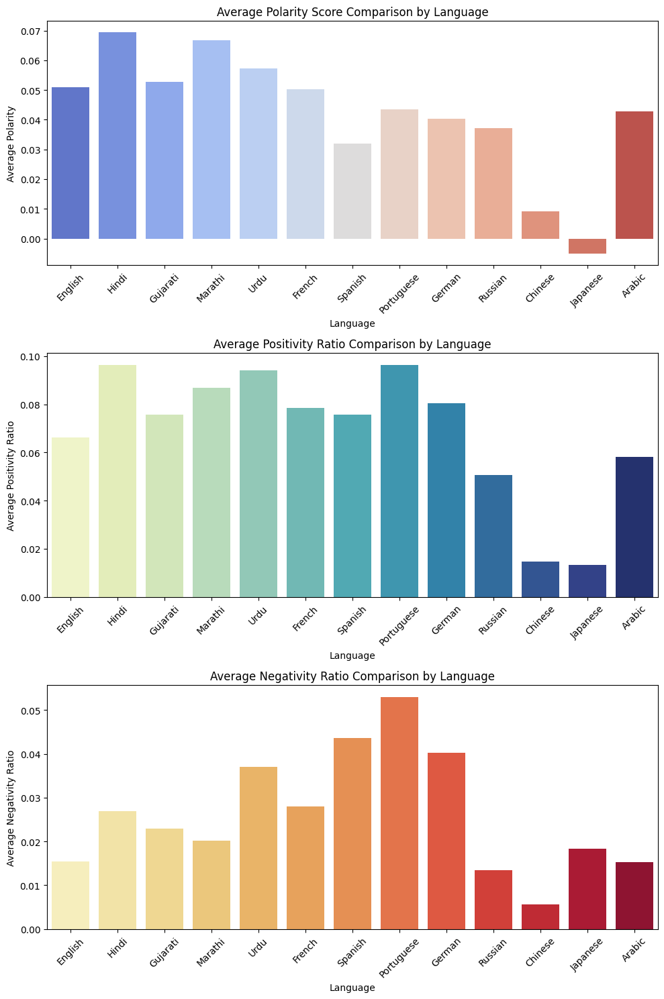

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Calculate overall sentiment overview per language
sentiment_overview = pd.DataFrame({
    "Average Polarity": polarity_df.mean(),
    "Average Positivity Ratio": positivity_df.mean(axis=1),
    "Average Negativity Ratio": negativity_df.mean(axis=1)
})

print("Sentiment Overview for Each Language:")
print(sentiment_overview)

# Plot the sentiment overview for each language
fig, axes = plt.subplots(3, 1, figsize=(10, 15))

# 1. Average Polarity for each language
sns.barplot(x=sentiment_overview.index, y="Average Polarity", data=sentiment_overview, ax=axes[0], palette="coolwarm")
axes[0].set_title("Average Polarity Score Comparison by Language")
axes[0].set_xlabel("Language")
axes[0].set_ylabel("Average Polarity")
axes[0].tick_params(axis='x', rotation=45)

# 2. Average Positivity Ratio for each language
sns.barplot(x=sentiment_overview.index, y="Average Positivity Ratio", data=sentiment_overview, ax=axes[1], palette="YlGnBu")
axes[1].set_title("Average Positivity Ratio Comparison by Language")
axes[1].set_xlabel("Language")
axes[1].set_ylabel("Average Positivity Ratio")
axes[1].tick_params(axis='x', rotation=45)

# 3. Average Negativity Ratio for each language
sns.barplot(x=sentiment_overview.index, y="Average Negativity Ratio", data=sentiment_overview, ax=axes[2], palette="YlOrRd")
axes[2].set_title("Average Negativity Ratio Comparison by Language")
axes[2].set_xlabel("Language")
axes[2].set_ylabel("Average Negativity Ratio")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


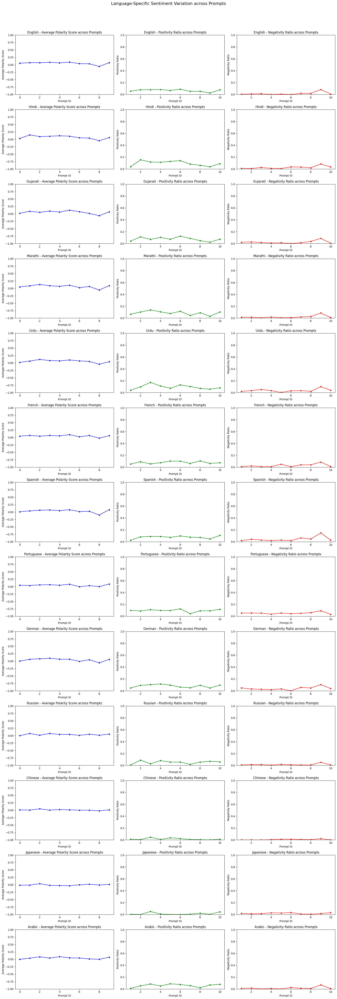

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Define a list of languages from the columns of Average Polarity Scores
languages = polarity_df.columns

# Set up figure for subplots
fig, axes = plt.subplots(len(languages), 3, figsize=(18, len(languages)*4))
fig.suptitle("Language-Specific Sentiment Variation across Prompts", fontsize=16, y=1.02)

for idx, lang in enumerate(languages):
    # Plot Average Polarity Score variation for each prompt
    sns.lineplot(data=polarity_df[lang], ax=axes[idx, 0], marker='o', color='b')
    axes[idx, 0].set_title(f"{lang} - Average Polarity Score across Prompts")
    axes[idx, 0].set_xlabel("Prompt ID")
    axes[idx, 0].set_ylabel("Average Polarity Score")
    axes[idx, 0].set_ylim(-1, 1)  # Set limits based on polarity scale

    # Plot Positivity Ratio variation for each prompt
    sns.lineplot(data=positivity_df.loc[lang], ax=axes[idx, 1], marker='o', color='g')
    axes[idx, 1].set_title(f"{lang} - Positivity Ratio across Prompts")
    axes[idx, 1].set_xlabel("Prompt ID")
    axes[idx, 1].set_ylabel("Positivity Ratio")
    axes[idx, 1].set_ylim(0, 1)  # Positivity and Negativity are ratio values

    # Plot Negativity Ratio variation for each prompt
    sns.lineplot(data=negativity_df.loc[lang], ax=axes[idx, 2], marker='o', color='r')
    axes[idx, 2].set_title(f"{lang} - Negativity Ratio across Prompts")
    axes[idx, 2].set_xlabel("Prompt ID")
    axes[idx, 2].set_ylabel("Negativity Ratio")
    axes[idx, 2].set_ylim(0, 1)

plt.tight_layout()
plt.show()


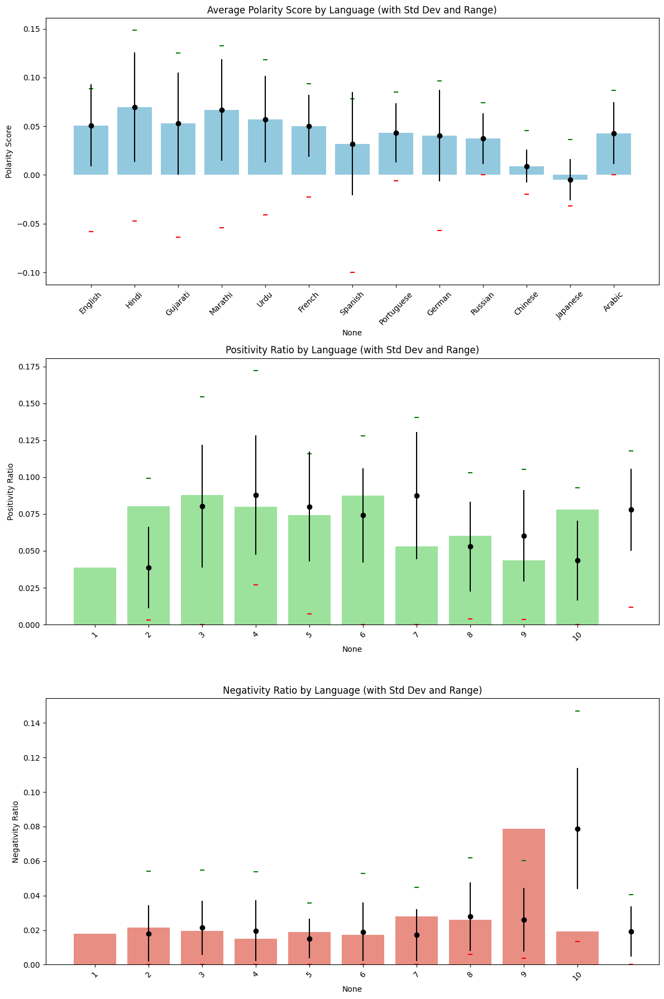

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Calculate descriptive statistics for each metric
polarity_stats = polarity_df.describe().T[['mean', 'std', 'min', 'max']]
positivity_stats = positivity_df.describe().T[['mean', 'std', 'min', 'max']]
negativity_stats = negativity_df.describe().T[['mean', 'std', 'min', 'max']]

# Rename columns for clarity
polarity_stats.columns = ["Mean Polarity", "Polarity Std Dev", "Min Polarity", "Max Polarity"]
positivity_stats.columns = ["Mean Positivity", "Positivity Std Dev", "Min Positivity", "Max Positivity"]
negativity_stats.columns = ["Mean Negativity", "Negativity Std Dev", "Min Negativity", "Max Negativity"]

# Plot each metric with mean, standard deviation, and range (min and max)
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# 1. Average Polarity Score variation by language
sns.barplot(data=polarity_stats, x=polarity_stats.index, y="Mean Polarity", ax=axes[0], color="skyblue")
axes[0].errorbar(x=polarity_stats.index, y=polarity_stats["Mean Polarity"],
                 yerr=polarity_stats["Polarity Std Dev"], fmt='o', color='black')
axes[0].scatter(polarity_stats.index, polarity_stats["Min Polarity"], color='red', marker='_')
axes[0].scatter(polarity_stats.index, polarity_stats["Max Polarity"], color='green', marker='_')
axes[0].set_title("Average Polarity Score by Language (with Std Dev and Range)")
axes[0].set_ylabel("Polarity Score")
axes[0].tick_params(axis='x', rotation=45)

# 2. Positivity Ratio variation by language
sns.barplot(data=positivity_stats, x=positivity_stats.index, y="Mean Positivity", ax=axes[1], color="lightgreen")
axes[1].errorbar(x=positivity_stats.index, y=positivity_stats["Mean Positivity"],
                 yerr=positivity_stats["Positivity Std Dev"], fmt='o', color='black')
axes[1].scatter(positivity_stats.index, positivity_stats["Min Positivity"], color='red', marker='_')
axes[1].scatter(positivity_stats.index, positivity_stats["Max Positivity"], color='green', marker='_')
axes[1].set_title("Positivity Ratio by Language (with Std Dev and Range)")
axes[1].set_ylabel("Positivity Ratio")
axes[1].tick_params(axis='x', rotation=45)

# 3. Negativity Ratio variation by language
sns.barplot(data=negativity_stats, x=negativity_stats.index, y="Mean Negativity", ax=axes[2], color="salmon")
axes[2].errorbar(x=negativity_stats.index, y=negativity_stats["Mean Negativity"],
                 yerr=negativity_stats["Negativity Std Dev"], fmt='o', color='black')
axes[2].scatter(negativity_stats.index, negativity_stats["Min Negativity"], color='red', marker='_')
axes[2].scatter(negativity_stats.index, negativity_stats["Max Negativity"], color='green', marker='_')
axes[2].set_title("Negativity Ratio by Language (with Std Dev and Range)")
axes[2].set_ylabel("Negativity Ratio")
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


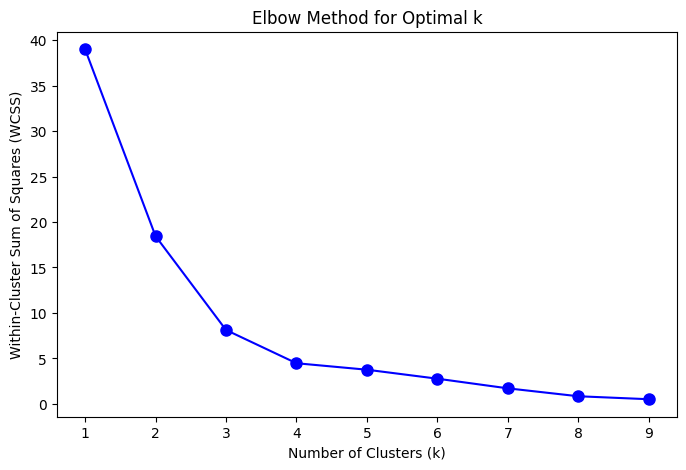

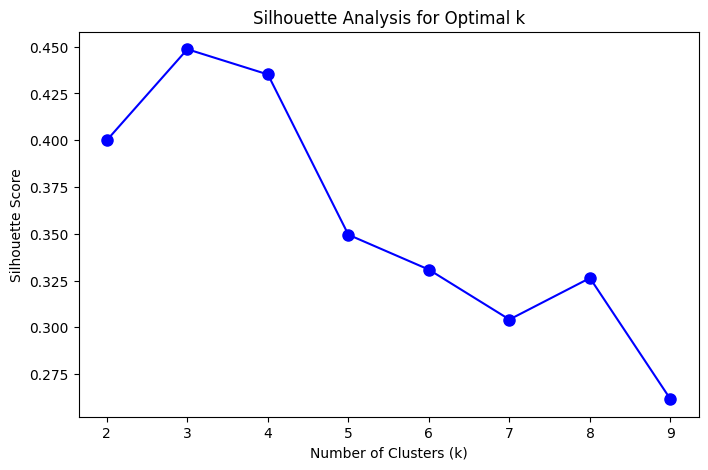

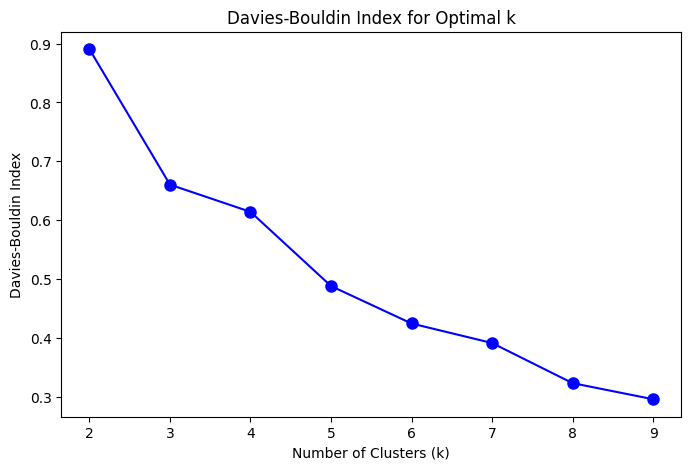

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

wcss = []
K = range(1, 10)  # Test clusters from 1 to 10
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(language_data_normalized)
    wcss.append(kmeans.inertia_)  # Inertia = within-cluster sum of squares

# Plot the Elbow curve
plt.figure(figsize=(8, 5))
plt.plot(K, wcss, 'bo-', markersize=8)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method for Optimal k")
plt.show()


############

from sklearn.metrics import silhouette_score

silhouette_scores = []
K = range(2, 10)  # Start from 2 clusters to 10
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(language_data_normalized)
    score = silhouette_score(language_data_normalized, kmeans.labels_)
    silhouette_scores.append(score)

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(K, silhouette_scores, 'bo-', markersize=8)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for Optimal k")
plt.show()


###########

from sklearn.metrics import davies_bouldin_score

db_scores = []
K = range(2, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(language_data_normalized)
    score = davies_bouldin_score(language_data_normalized, kmeans.labels_)
    db_scores.append(score)

# Plot Davies-Bouldin Scores
plt.figure(figsize=(8, 5))
plt.plot(K, db_scores, 'bo-', markersize=8)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Davies-Bouldin Index")
plt.title("Davies-Bouldin Index for Optimal k")
plt.show()


<ipython-input-39-0dd29b3df8a5>:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=language_data.PCA1[i], y=language_data.PCA2[i], s=language_data.index[i],


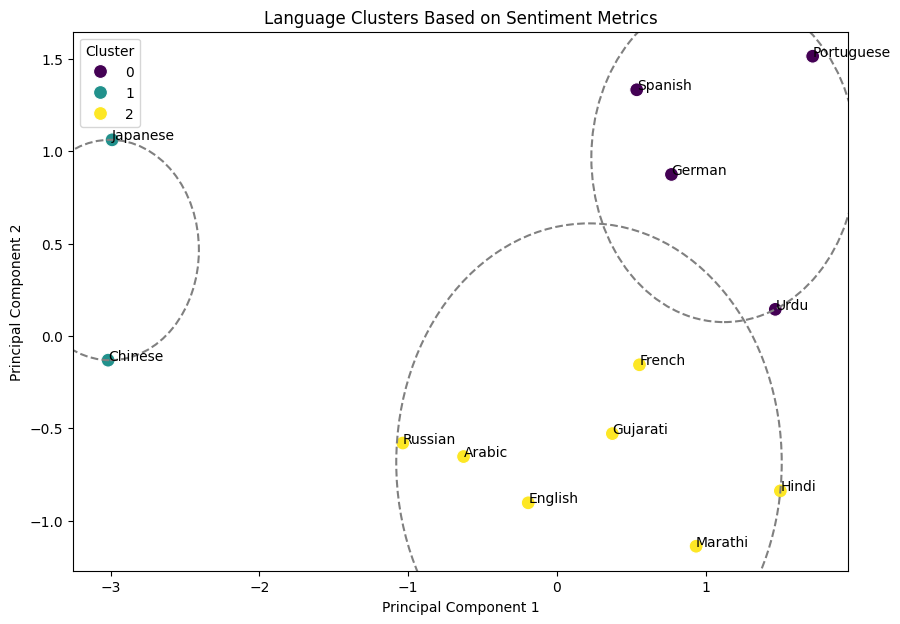

Clustering Analysis Results:
            Average Polarity  Average Positivity Ratio  \
English             0.050848                  0.066295   
Hindi               0.069499                  0.096392   
Gujarati            0.052784                  0.075768   
Marathi             0.066643                  0.086785   
Urdu                0.057171                  0.094190   
French              0.050348                  0.078409   
Spanish             0.032057                  0.075669   
Portuguese          0.043412                  0.096448   
German              0.040299                  0.080571   
Russian             0.037250                  0.050751   
Chinese             0.009087                  0.014727   
Japanese           -0.005093                  0.013268   
Arabic              0.042821                  0.058144   

            Average Negativity Ratio  Cluster  
English                     0.015448        2  
Hindi                       0.026894        2  
Gujarati      

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Aggregate sentiment metrics for clustering
language_data = pd.DataFrame({
    "Average Polarity": polarity_df.mean(),
    "Average Positivity Ratio": positivity_df.mean(axis=1),
    "Average Negativity Ratio": negativity_df.mean(axis=1)
})

# Normalize the data
scaler = StandardScaler()
language_data_normalized = scaler.fit_transform(language_data)

# Choose the number of clusters (e.g., 3 for simplicity)
kmeans = KMeans(n_clusters=3, random_state=42)
language_data['Cluster'] = kmeans.fit_predict(language_data_normalized)

# Visualize clusters with PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(language_data_normalized)
language_data['PCA1'] = pca_result[:, 0]
language_data['PCA2'] = pca_result[:, 1]

plt.figure(figsize=(10, 7))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=language_data, palette="viridis", s=100)
for i in range(language_data.shape[0]):
    plt.text(x=language_data.PCA1[i], y=language_data.PCA2[i], s=language_data.index[i],
             fontdict=dict(color='black', size=10))

# Draw circles around each cluster
cluster_centers = kmeans.cluster_centers_
pca_centers = pca.transform(cluster_centers)  # Project cluster centers onto PCA space
for idx, (center_x, center_y) in enumerate(pca_centers):
    radius = max(
        ((language_data[language_data['Cluster'] == idx][['PCA1', 'PCA2']] - [center_x, center_y])**2).sum(axis=1)
    ) ** 0.5  # Calculate the radius as the max distance from center
    circle = plt.Circle((center_x, center_y), radius, color='grey', fill=False, linestyle='--', linewidth=1.5)
    plt.gca().add_patch(circle)

plt.title("Language Clusters Based on Sentiment Metrics")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='Cluster')
plt.show()

# Display clustering results
print("Clustering Analysis Results:")
print(language_data[['Average Polarity', 'Average Positivity Ratio', 'Average Negativity Ratio', 'Cluster']])


Sentiment Statistics by Cluster:
        Average Polarity                                \
                    mean       std       min       max   
Cluster                                                  
0               0.043235  0.010453  0.032057  0.057171   
1               0.001997  0.010027 -0.005093  0.009087   
2               0.052885  0.011702  0.037250  0.069499   

        Average Positivity Ratio                                \
                            mean       std       min       max   
Cluster                                                          
0                       0.086720  0.010171  0.075669  0.096448   
1                       0.013998  0.001032  0.013268  0.014727   
2                       0.073221  0.015992  0.050751  0.096392   

        Average Negativity Ratio                                
                            mean       std       min       max  
Cluster                                                         
0                       0.

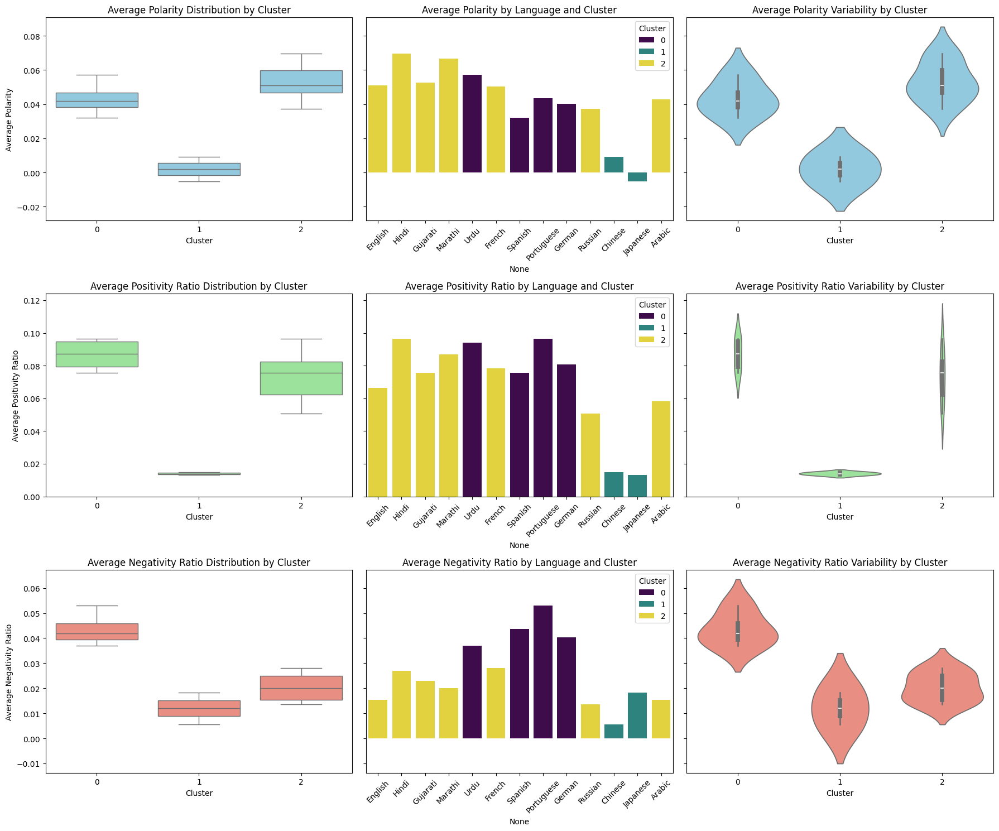

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load the Excel file
file_path = 'polyglot_sentiment_analysis_results.xlsx'
xls = pd.ExcelFile(file_path)

# Load each sheet into a DataFrame
polarity_df = xls.parse("Average_Polarity_Scores").drop(columns=["Unnamed: 0"])
positivity_df = xls.parse("Positivity_Ratios").set_index("Unnamed: 0")
negativity_df = xls.parse("Negativity_Ratios").set_index("Unnamed: 0")

# Aggregate sentiment metrics for clustering
language_data = pd.DataFrame({
    "Average Polarity": polarity_df.mean(),
    "Average Positivity Ratio": positivity_df.mean(axis=1),
    "Average Negativity Ratio": negativity_df.mean(axis=1)
})

# Normalize the data
scaler = StandardScaler()
language_data_normalized = scaler.fit_transform(language_data)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
language_data['Cluster'] = kmeans.fit_predict(language_data_normalized)

# Calculate sentiment statistics by cluster
clustered_stats = language_data.groupby('Cluster').agg({
    "Average Polarity": ['mean', 'std', 'min', 'max'],
    "Average Positivity Ratio": ['mean', 'std', 'min', 'max'],
    "Average Negativity Ratio": ['mean', 'std', 'min', 'max']
})
print("Sentiment Statistics by Cluster:")
print(clustered_stats)

# Plot sentiment variation within each cluster
fig, axes = plt.subplots(3, 3, figsize=(18, 15), sharey='row')

# Loop over each metric and cluster to visualize the sentiment distribution
metrics = ["Average Polarity", "Average Positivity Ratio", "Average Negativity Ratio"]
colors = [["#87CEEB"], ["#90EE90"], ["#FA8072"]]  # Using hex color codes for skyblue, lightgreen, and salmon

for i, (metric, color) in enumerate(zip(metrics, colors)):
    # Distribution of each metric by cluster
    sns.boxplot(data=language_data, x="Cluster", y=metric, ax=axes[i, 0], color=color[0])
    axes[i, 0].set_title(f"{metric} Distribution by Cluster")

    # Average and Std Deviation of each metric by language within each cluster
    sns.barplot(data=language_data, x=language_data.index, y=metric, hue="Cluster", ax=axes[i, 1], palette="viridis")
    axes[i, 1].set_title(f"{metric} by Language and Cluster")
    axes[i, 1].tick_params(axis='x', rotation=45)

    # Violin plot for each metric by cluster
    sns.violinplot(data=language_data, x="Cluster", y=metric, ax=axes[i, 2], color=color[0])
    axes[i, 2].set_title(f"{metric} Variability by Cluster")

# Adjust layout
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


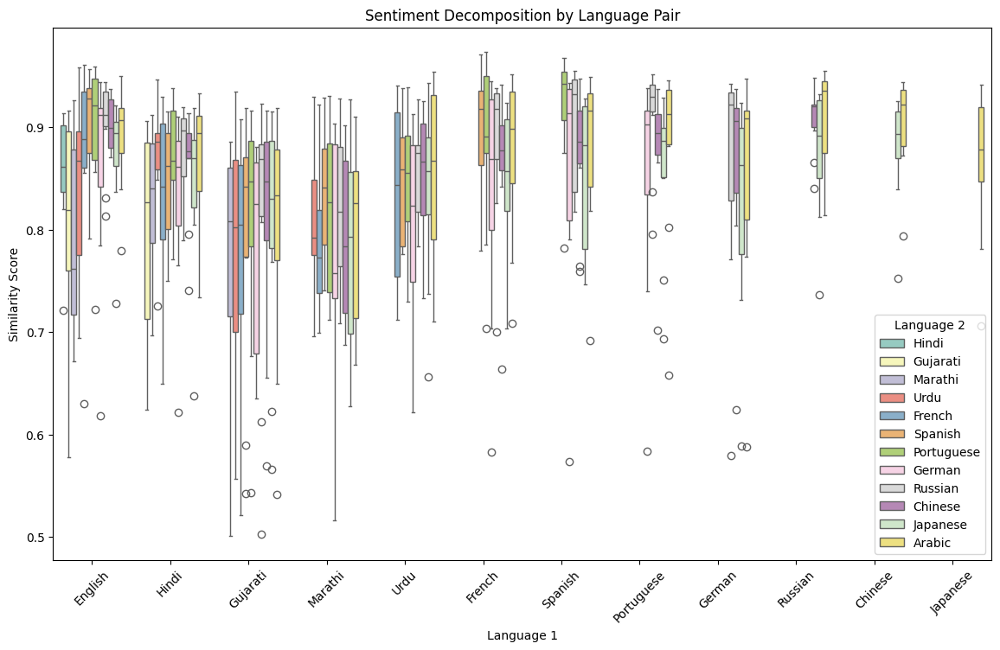

<ipython-input-50-a45b8ff69651>:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=shift_df, x="Language_Pair", y="Shift_Score", palette="coolwarm", inner="quartile")


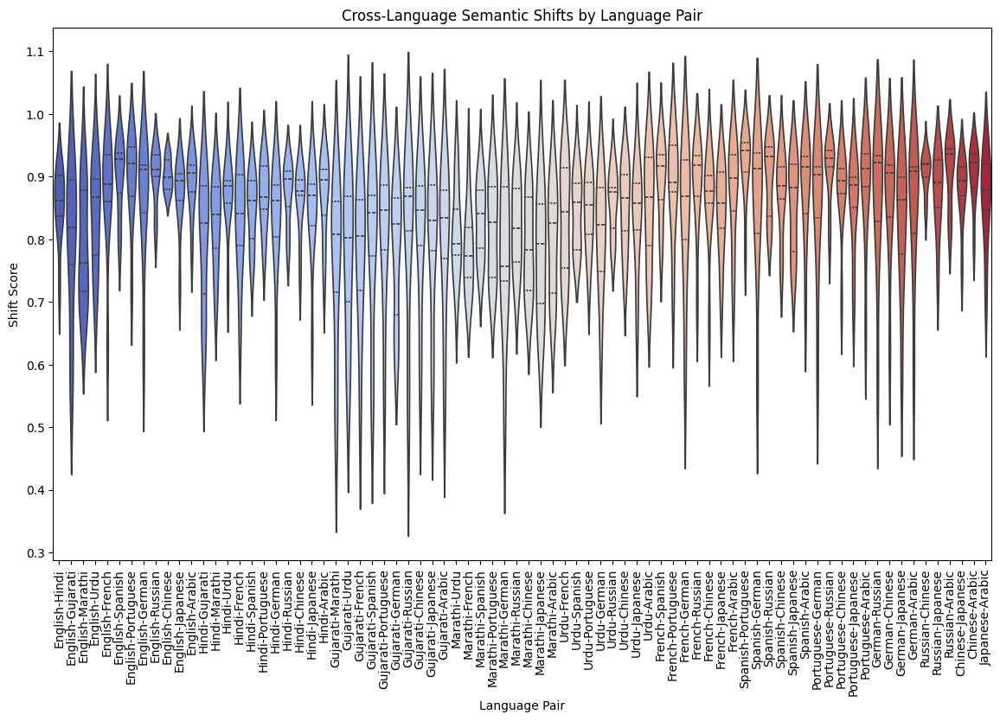

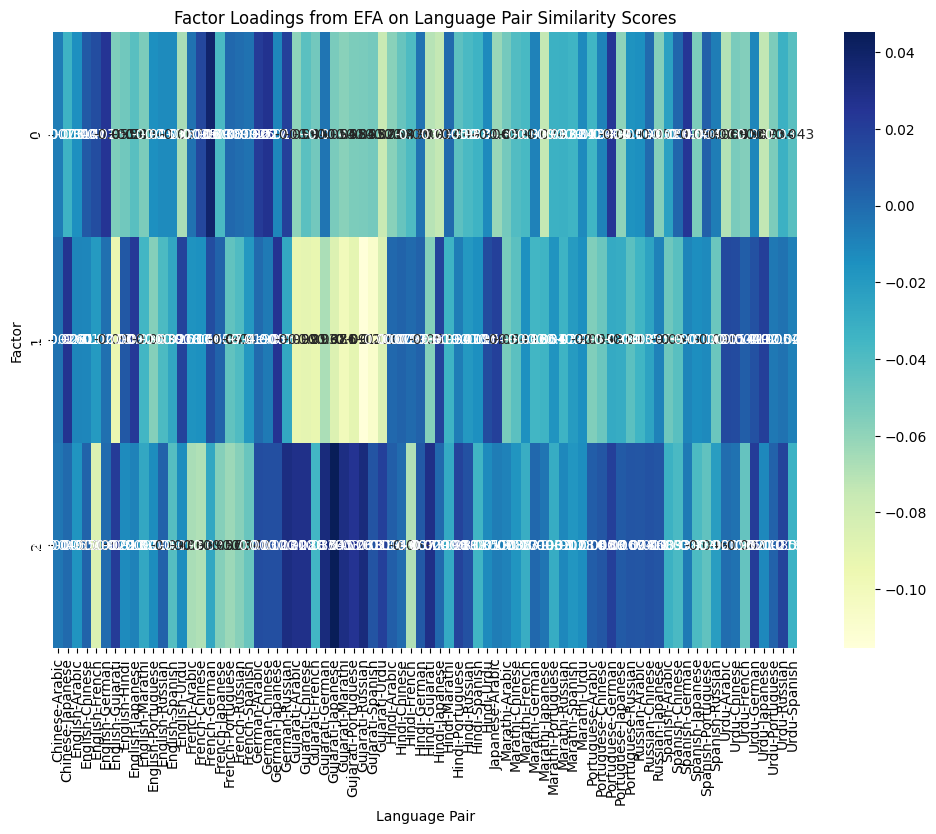

In [ ]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
from sklearn.decomposition import FactorAnalysis
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Initialize the transformer model
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Step 1: Sentiment Decomposition by Language Pair
# Calculate pairwise sentiment similarity and group by language pairs
sentiment_data = []

for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            sentiment_data.append({
                "Prompt_ID": prompt_id,
                "Language_1": languages[i],
                "Language_2": languages[j],
                "Similarity_Score": similarity_matrix[i][j].item()
            })

sentiment_df = pd.DataFrame(sentiment_data)

# Plot distribution of sentiment similarity for each language pair
plt.figure(figsize=(14, 8))
sns.boxplot(data=sentiment_df, x="Language_1", y="Similarity_Score", hue="Language_2", palette="Set3")
plt.title("Sentiment Decomposition by Language Pair")
plt.xlabel("Language 1")
plt.ylabel("Similarity Score")
plt.xticks(rotation=45)
plt.legend(title="Language 2")
plt.show()

# Step 2: Cross-Language Semantic Shifts
# Calculate cross-language similarity shift per prompt
semantic_shift_data = []

for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            semantic_shift_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Shift_Score": similarity_matrix[i][j].item()
            })

shift_df = pd.DataFrame(semantic_shift_data)

# Violin plot to show the distribution of similarity shifts across language pairs
plt.figure(figsize=(14, 8))
sns.violinplot(data=shift_df, x="Language_Pair", y="Shift_Score", palette="coolwarm", inner="quartile")
plt.title("Cross-Language Semantic Shifts by Language Pair")
plt.xlabel("Language Pair")
plt.ylabel("Shift Score")
plt.xticks(rotation=90)
plt.show()

# Step 3: Exploratory Factor Analysis (EFA) on Semantic Similarity Scores
# Aggregate similarity scores by prompt and language pair for EFA
pivot_df = shift_df.pivot(index="Prompt_ID", columns="Language_Pair", values="Shift_Score").fillna(0)

# Perform Exploratory Factor Analysis
fa = FactorAnalysis(n_components=3, random_state=0)  # Adjust components as needed
factor_results = fa.fit_transform(pivot_df)

# Plot the factor loadings to interpret underlying structures
plt.figure(figsize=(12, 8))
sns.heatmap(fa.components_, annot=True, cmap="YlGnBu", xticklabels=pivot_df.columns)
plt.title("Factor Loadings from EFA on Language Pair Similarity Scores")
plt.xlabel("Language Pair")
plt.ylabel("Factor")
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Descriptive Statistics for Sentiment Decomposition by Language Pair:
                      mean       std
Language_Pair                       
Chinese-Arabic    0.903967  0.046458
Chinese-Japanese  0.879991  0.052351
English-Arabic    0.889899  0.050127
English-Chinese   0.902305  0.025746
English-French    0.875712  0.094175
...                    ...       ...
Urdu-German       0.808100  0.091840
Urdu-Japanese     0.836145  0.084501
Urdu-Portuguese   0.845988  0.063811
Urdu-Russian      0.860389  0.051639
Urdu-Spanish      0.845615  0.060374

[78 rows x 2 columns]

ANOVA Table for Sentiment Decomposition by Language Pair:
                    sum_sq     df         F        PR(>F)
C(Language_Pair)  1.217267   77.0  2.153203  2.291160e-07
Residual          5.154032  702.0       NaN           NaN
Effect Size (Eta Squared) for Sentiment Decomposition by Language Pair: 0.191

Descriptive Statistics for Cross-Language Semantic Shifts by Prompt ID:
               mean       std
Prompt_ID    

<ipython-input-48-fc8c07add7b3>:81: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=sentiment_df, x="Language_Pair", y="Similarity_Score", palette="YlGnBu")


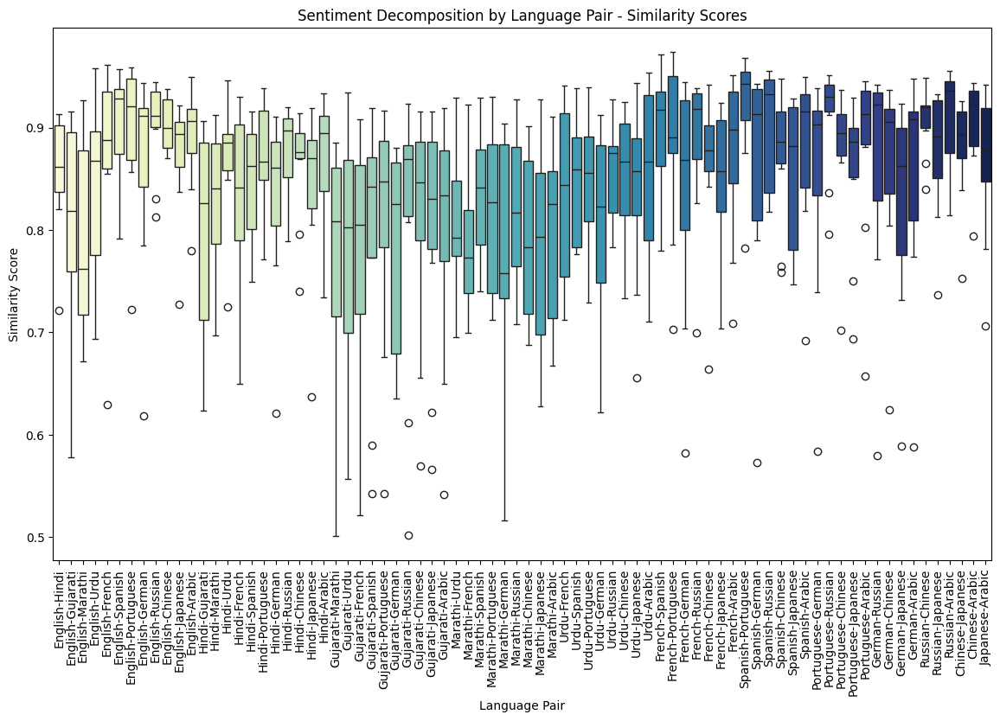

<ipython-input-48-fc8c07add7b3>:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=shift_df, x="Prompt_ID", y="Shift_Score", palette="coolwarm", inner="quartile")


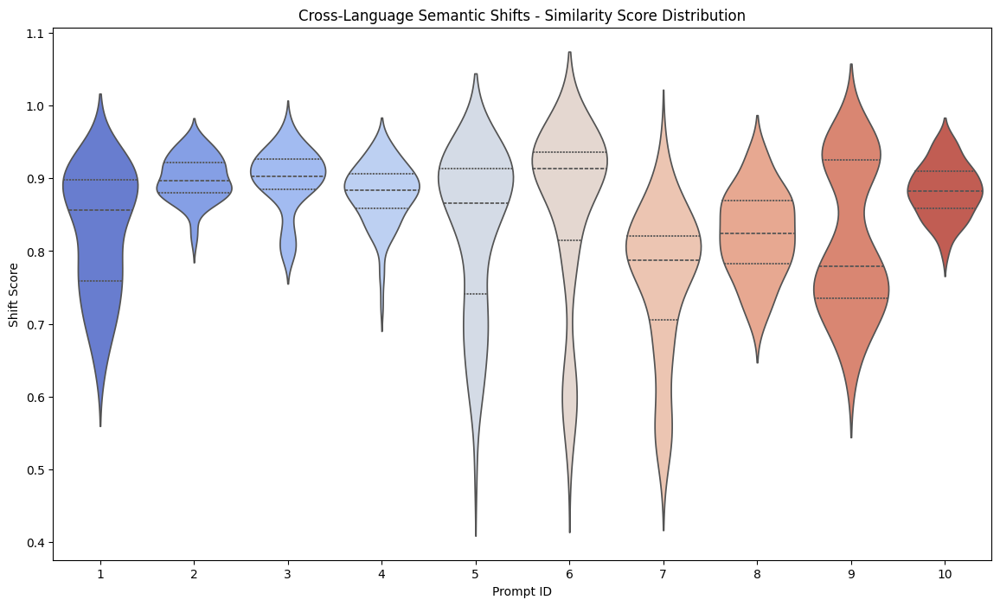

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer, util

# Load the Excel file with responses per language
df = pd.read_excel("modified_results.xlsx")

# Initialize the model and languages
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
languages = ["English", "Hindi", "Gujarati", "Marathi", "Urdu", "French",
             "Spanish", "Portuguese", "German", "Russian", "Chinese", "Japanese", "Arabic"]

# Step 1: Sentiment Decomposition by Language Pair - Similarity Scores ANOVA
sentiment_data = []
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            sentiment_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Similarity_Score": similarity_matrix[i][j].item()
            })

sentiment_df = pd.DataFrame(sentiment_data)

# Descriptive Statistics for Sentiment Scores by Language Pair
sentiment_desc = sentiment_df.groupby("Language_Pair")["Similarity_Score"].agg(['mean', 'std'])
print("Descriptive Statistics for Sentiment Decomposition by Language Pair:")
print(sentiment_desc)

# Perform ANOVA using statsmodels for detailed results
model_sentiment = ols('Similarity_Score ~ C(Language_Pair)', data=sentiment_df).fit()
anova_table_sentiment = sm.stats.anova_lm(model_sentiment, typ=2)
eta_squared_sentiment = anova_table_sentiment['sum_sq'] / anova_table_sentiment['sum_sq'].sum()

print("\nANOVA Table for Sentiment Decomposition by Language Pair:")
print(anova_table_sentiment)
print(f"Effect Size (Eta Squared) for Sentiment Decomposition by Language Pair: {eta_squared_sentiment['C(Language_Pair)']:.3f}")

# Step 2: Cross-Language Semantic Shifts - Similarity Shifts ANOVA
semantic_shift_data = []
for prompt_id in df['Prompt_ID'].unique():
    responses = [df.loc[df['Prompt_ID'] == prompt_id, f"{lang}_Response"].values[0] for lang in languages]
    embeddings = model.encode(responses, convert_to_tensor=True)
    similarity_matrix = util.cos_sim(embeddings, embeddings).cpu().numpy()

    for i in range(len(languages)):
        for j in range(i + 1, len(languages)):
            semantic_shift_data.append({
                "Prompt_ID": prompt_id,
                "Language_Pair": f"{languages[i]}-{languages[j]}",
                "Shift_Score": similarity_matrix[i][j].item()
            })

shift_df = pd.DataFrame(semantic_shift_data)

# Descriptive Statistics for Shift Scores by Prompt ID
shift_desc = shift_df.groupby("Prompt_ID")["Shift_Score"].agg(['mean', 'std'])
print("\nDescriptive Statistics for Cross-Language Semantic Shifts by Prompt ID:")
print(shift_desc)

# Perform ANOVA for Shift Scores using statsmodels
model_shift = ols('Shift_Score ~ C(Prompt_ID)', data=shift_df).fit()
anova_table_shift = sm.stats.anova_lm(model_shift, typ=2)
eta_squared_shift = anova_table_shift['sum_sq'] / anova_table_shift['sum_sq'].sum()

print("\nANOVA Table for Cross-Language Semantic Shifts by Prompt ID:")
print(anova_table_shift)
print(f"Effect Size (Eta Squared) for Cross-Language Semantic Shifts: {eta_squared_shift['C(Prompt_ID)']:.3f}")

# Visualization of Similarity Score Distributions for Each Analysis
# Boxplot for Sentiment Decomposition by Language Pair
plt.figure(figsize=(14, 8))
sns.boxplot(data=sentiment_df, x="Language_Pair", y="Similarity_Score", palette="YlGnBu")
plt.title("Sentiment Decomposition by Language Pair - Similarity Scores")
plt.xlabel("Language Pair")
plt.ylabel("Similarity Score")
plt.xticks(rotation=90)
plt.show()

# Violin plot for Cross-Language Semantic Shifts
plt.figure(figsize=(14, 8))
sns.violinplot(data=shift_df, x="Prompt_ID", y="Shift_Score", palette="coolwarm", inner="quartile")
plt.title("Cross-Language Semantic Shifts - Similarity Score Distribution")
plt.xlabel("Prompt ID")
plt.ylabel("Shift Score")
plt.show()
